# DonorsChoose

<p>
DonorsChoose.org receives hundreds of thousands of project proposals each year for classroom projects in need of funding. Right now, a large number of volunteers is needed to manually screen each submission before it's approved to be posted on the DonorsChoose.org website.
</p>
<p>
    Next year, DonorsChoose.org expects to receive close to 500,000 project proposals. As a result, there are three main problems they need to solve:
<ul>
<li>
    How to scale current manual processes and resources to screen 500,000 projects so that they can be posted as quickly and as efficiently as possible</li>
    <li>How to increase the consistency of project vetting across different volunteers to improve the experience for teachers</li>
    <li>How to focus volunteer time on the applications that need the most assistance</li>
    </ul>
</p>    
<p>
The goal of the competition is to predict whether or not a DonorsChoose.org project proposal submitted by a teacher will be approved, using the text of project descriptions as well as additional metadata about the project, teacher, and school. DonorsChoose.org can then use this information to identify projects most likely to need further review before approval.
</p>

## About the DonorsChoose Data Set

The `train.csv` data set provided by DonorsChoose contains the following features:

Feature | Description 
----------|---------------
**`project_id`** | A unique identifier for the proposed project. **Example:** `p036502`   
**`project_title`**    | Title of the project. **Examples:**<br><ul><li><code>Art Will Make You Happy!</code></li><li><code>First Grade Fun</code></li></ul> 
**`project_grade_category`** | Grade level of students for which the project is targeted. One of the following enumerated values: <br/><ul><li><code>Grades PreK-2</code></li><li><code>Grades 3-5</code></li><li><code>Grades 6-8</code></li><li><code>Grades 9-12</code></li></ul>  
 **`project_subject_categories`** | One or more (comma-separated) subject categories for the project from the following enumerated list of values:  <br/><ul><li><code>Applied Learning</code></li><li><code>Care &amp; Hunger</code></li><li><code>Health &amp; Sports</code></li><li><code>History &amp; Civics</code></li><li><code>Literacy &amp; Language</code></li><li><code>Math &amp; Science</code></li><li><code>Music &amp; The Arts</code></li><li><code>Special Needs</code></li><li><code>Warmth</code></li></ul><br/> **Examples:** <br/><ul><li><code>Music &amp; The Arts</code></li><li><code>Literacy &amp; Language, Math &amp; Science</code></li>  
  **`school_state`** | State where school is located ([Two-letter U.S. postal code](https://en.wikipedia.org/wiki/List_of_U.S._state_abbreviations#Postal_codes)). **Example:** `WY`
**`project_subject_subcategories`** | One or more (comma-separated) subject subcategories for the project. **Examples:** <br/><ul><li><code>Literacy</code></li><li><code>Literature &amp; Writing, Social Sciences</code></li></ul> 
**`project_resource_summary`** | An explanation of the resources needed for the project. **Example:** <br/><ul><li><code>My students need hands on literacy materials to manage sensory needs!</code</li></ul> 
**`project_essay_1`**    | First application essay<sup>*</sup>  
**`project_essay_2`**    | Second application essay<sup>*</sup> 
**`project_essay_3`**    | Third application essay<sup>*</sup> 
**`project_essay_4`**    | Fourth application essay<sup>*</sup> 
**`project_submitted_datetime`** | Datetime when project application was submitted. **Example:** `2016-04-28 12:43:56.245`   
**`teacher_id`** | A unique identifier for the teacher of the proposed project. **Example:** `bdf8baa8fedef6bfeec7ae4ff1c15c56`  
**`teacher_prefix`** | Teacher's title. One of the following enumerated values: <br/><ul><li><code>nan</code></li><li><code>Dr.</code></li><li><code>Mr.</code></li><li><code>Mrs.</code></li><li><code>Ms.</code></li><li><code>Teacher.</code></li></ul>  
**`teacher_number_of_previously_posted_projects`** | Number of project applications previously submitted by the same teacher. **Example:** `2` 

<sup>*</sup> See the section <b>Notes on the Essay Data</b> for more details about these features.

Additionally, the `resources.csv` data set provides more data about the resources required for each project. Each line in this file represents a resource required by a project:

Feature | Description 
----------|---------------
**`id`** | A `project_id` value from the `train.csv` file.  **Example:** `p036502`   
**`description`** | Desciption of the resource. **Example:** `Tenor Saxophone Reeds, Box of 25`   
**`quantity`** | Quantity of the resource required. **Example:** `3`   
**`price`** | Price of the resource required. **Example:** `9.95`   

**Note:** Many projects require multiple resources. The `id` value corresponds to a `project_id` in train.csv, so you use it as a key to retrieve all resources needed for a project:

The data set contains the following label (the value you will attempt to predict):

Label | Description
----------|---------------
`project_is_approved` | A binary flag indicating whether DonorsChoose approved the project. A value of `0` indicates the project was not approved, and a value of `1` indicates the project was approved.

### Notes on the Essay Data

<ul>
Prior to May 17, 2016, the prompts for the essays were as follows:
<li>__project_essay_1:__ "Introduce us to your classroom"</li>
<li>__project_essay_2:__ "Tell us more about your students"</li>
<li>__project_essay_3:__ "Describe how your students will use the materials you're requesting"</li>
<li>__project_essay_3:__ "Close by sharing why your project will make a difference"</li>
</ul>


<ul>
Starting on May 17, 2016, the number of essays was reduced from 4 to 2, and the prompts for the first 2 essays were changed to the following:<br>
<li>__project_essay_1:__ "Describe your students: What makes your students special? Specific details about their background, your neighborhood, and your school are all helpful."</li>
<li>__project_essay_2:__ "About your project: How will these materials make a difference in your students' learning and improve their school lives?"</li>
<br>For all projects with project_submitted_datetime of 2016-05-17 and later, the values of project_essay_3 and project_essay_4 will be NaN.
</ul>


In [1]:
%matplotlib inline
import warnings
warnings.filterwarnings("ignore")

import sqlite3
import pandas as pd
import numpy as np
import nltk
import string
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.feature_extraction.text import TfidfTransformer
from sklearn.feature_extraction.text import TfidfVectorizer

from sklearn.feature_extraction.text import CountVectorizer
from sklearn.metrics import confusion_matrix
from sklearn import metrics
from sklearn.metrics import roc_curve, auc
from nltk.stem.porter import PorterStemmer

import re
import string
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer
from nltk.stem.wordnet import WordNetLemmatizer

from gensim.models import Word2Vec
from gensim.models import KeyedVectors
import pickle

from tqdm import tqdm
import os

from plotly import plotly
import plotly.offline as offline
import plotly.graph_objs as go
offline.init_notebook_mode()
from collections import Counter

## 1.1 Reading Data

In [105]:
project_data = pd.read_csv('train_data.csv',nrows = 60000)
resource_data = pd.read_csv('resources.csv')

In [106]:
print("Number of data points in train data", project_data.shape)
print('-'*50)
print("The attributes of data :", project_data.columns.values)

Number of data points in train data (60000, 17)
--------------------------------------------------
The attributes of data : ['Unnamed: 0' 'id' 'teacher_id' 'teacher_prefix' 'school_state'
 'project_submitted_datetime' 'project_grade_category'
 'project_subject_categories' 'project_subject_subcategories'
 'project_title' 'project_essay_1' 'project_essay_2' 'project_essay_3'
 'project_essay_4' 'project_resource_summary'
 'teacher_number_of_previously_posted_projects' 'project_is_approved']


In [107]:
print("Number of data points in train data", resource_data.shape)
print(resource_data.columns.values)
resource_data.head(2)

Number of data points in train data (1541272, 4)
['id' 'description' 'quantity' 'price']


,id,description,quantity,price
0,p233245,LC652 - Lakeshore Double-Space Mobile Drying Rack,1,149.00
1,p069063,Bouncy Bands for Desks (Blue support pipes),3,14.95


## 1.2 preprocessing of `project_subject_categories`

In [108]:
catogories = list(project_data['project_subject_categories'].values)
# remove special characters from list of strings python: https://stackoverflow.com/a/47301924/4084039

# https://www.geeksforgeeks.org/removing-stop-words-nltk-python/
# https://stackoverflow.com/questions/23669024/how-to-strip-a-specific-word-from-a-string
# https://stackoverflow.com/questions/8270092/remove-all-whitespace-in-a-string-in-python
cat_list = []
for i in catogories:
    temp = ""
    # consider we have text like this "Math & Science, Warmth, Care & Hunger"
    for j in i.split(','): # it will split it in three parts ["Math & Science", "Warmth", "Care & Hunger"]
        if 'The' in j.split(): # this will split each of the catogory based on space "Math & Science"=> "Math","&", "Science"
            j=j.replace('The','') # if we have the words "The" we are going to replace it with ''(i.e removing 'The')
        j = j.replace(' ','') # we are placeing all the ' '(space) with ''(empty) ex:"Math & Science"=>"Math&Science"
        temp+=j.strip()+" " #" abc ".strip() will return "abc", remove the trailing spaces
        temp = temp.replace('&','_') # we are replacing the & value into 
    cat_list.append(temp.strip())
    
project_data['clean_categories'] = cat_list
project_data.drop(['project_subject_categories'], axis=1, inplace=True)

from collections import Counter
my_counter = Counter()
for word in project_data['clean_categories'].values:
    my_counter.update(word.split())

cat_dict = dict(my_counter)
sorted_cat_dict = dict(sorted(cat_dict.items(), key=lambda kv: kv[1]))


## 1.3 preprocessing of `project_subject_subcategories`

In [109]:
sub_catogories = list(project_data['project_subject_subcategories'].values)
# remove special characters from list of strings python: https://stackoverflow.com/a/47301924/4084039

# https://www.geeksforgeeks.org/removing-stop-words-nltk-python/
# https://stackoverflow.com/questions/23669024/how-to-strip-a-specific-word-from-a-string
# https://stackoverflow.com/questions/8270092/remove-all-whitespace-in-a-string-in-python

sub_cat_list = []
for i in sub_catogories:
    temp = ""
    # consider we have text like this "Math & Science, Warmth, Care & Hunger"
    for j in i.split(','): # it will split it in three parts ["Math & Science", "Warmth", "Care & Hunger"]
        if 'The' in j.split(): # this will split each of the catogory based on space "Math & Science"=> "Math","&", "Science"
            j=j.replace('The','') # if we have the words "The" we are going to replace it with ''(i.e removing 'The')
        j = j.replace(' ','') # we are placeing all the ' '(space) with ''(empty) ex:"Math & Science"=>"Math&Science"
        temp +=j.strip()+" "#" abc ".strip() will return "abc", remove the trailing spaces
        temp = temp.replace('&','_')
    sub_cat_list.append(temp.strip())

project_data['clean_subcategories'] = sub_cat_list
project_data.drop(['project_subject_subcategories'], axis=1, inplace=True)

# count of all the words in corpus python: https://stackoverflow.com/a/22898595/4084039
my_counter = Counter()
for word in project_data['clean_subcategories'].values:
    my_counter.update(word.split())
    
sub_cat_dict = dict(my_counter)
sorted_sub_cat_dict = dict(sorted(sub_cat_dict.items(), key=lambda kv: kv[1]))

In [110]:
# how to replace elements in list python: https://stackoverflow.com/a/2582163/4084039
cols = ['Date' if x=='project_submitted_datetime' else x for x in list(project_data.columns)]


#sort dataframe based on time pandas python: https://stackoverflow.com/a/49702492/4084039
project_data['Date'] = pd.to_datetime(project_data['project_submitted_datetime'])
project_data.drop('project_submitted_datetime', axis=1, inplace=True)
project_data.sort_values(by=['Date'], inplace=True)


# how to reorder columns pandas python: https://stackoverflow.com/a/13148611/4084039
project_data = project_data[cols]


project_data.head(2)

,Unnamed: 0,id,teacher_id,teacher_prefix,school_state,Date,project_grade_category,project_title,project_essay_1,project_essay_2,project_essay_3,project_essay_4,project_resource_summary,teacher_number_of_previously_posted_projects,project_is_approved,clean_categories,clean_subcategories
55660,8393,p205479,2bf07ba08945e5d8b2a3f269b2b3cfe5,Mrs.,CA,2016-04-27 00:27:36,Grades PreK-2,Engineering STEAM into the Primary Classroom,I have been fortunate enough to use the Fairy ...,My students come from a variety of backgrounds...,Each month I try to do several science or STEM...,It is challenging to develop high quality scie...,My students need STEM kits to learn critical s...,53,1,Math_Science,AppliedSciences Health_LifeScience
51140,74477,p189804,4a97f3a390bfe21b99cf5e2b81981c73,Mrs.,CA,2016-04-27 00:46:53,Grades PreK-2,Mobile Learning with a Mobile Listening Center,Having a class of 24 students comes with diver...,I have a class of twenty-four kindergarten stu...,By having a mobile listening and storage cente...,A mobile listening center will help keep equip...,My students need a mobile listening center to ...,10,1,Literacy_Language,Literacy


In [111]:
#preprocessing project_grade_categories
#project_grade contain grade with space so we remove the grades from the data set

project_grade= list(project_data['project_grade_category'].values)
# remove special characters from list of strings python:
# https://www.geeksforgeeks.org/removing-stop-words-nltk-python/

grade_cat_list = []
for i in project_grade:
# consider we have text like this:
    for j in i.split(' '): # # split by space
        j=j.replace('Grades','')# clean grades from the row
    grade_cat_list.append(j.strip())
    
project_data['clean_grade'] = grade_cat_list
project_data.drop(['project_grade_category'], axis=1, inplace=True)

my_counter = Counter()
for word in project_data['clean_grade'].values:
     my_counter.update(word.split())
project_grade_category_dict= dict(my_counter)
sorted_project_grade_category_dict = dict(sorted(project_grade_category_dict.items(), key=lambda kv: kv[1]))

In [112]:
project_data.head(2)

,Unnamed: 0,id,teacher_id,teacher_prefix,school_state,Date,project_title,project_essay_1,project_essay_2,project_essay_3,project_essay_4,project_resource_summary,teacher_number_of_previously_posted_projects,project_is_approved,clean_categories,clean_subcategories,clean_grade
55660,8393,p205479,2bf07ba08945e5d8b2a3f269b2b3cfe5,Mrs.,CA,2016-04-27 00:27:36,Engineering STEAM into the Primary Classroom,I have been fortunate enough to use the Fairy ...,My students come from a variety of backgrounds...,Each month I try to do several science or STEM...,It is challenging to develop high quality scie...,My students need STEM kits to learn critical s...,53,1,Math_Science,AppliedSciences Health_LifeScience,PreK-2
51140,74477,p189804,4a97f3a390bfe21b99cf5e2b81981c73,Mrs.,CA,2016-04-27 00:46:53,Mobile Learning with a Mobile Listening Center,Having a class of 24 students comes with diver...,I have a class of twenty-four kindergarten stu...,By having a mobile listening and storage cente...,A mobile listening center will help keep equip...,My students need a mobile listening center to ...,10,1,Literacy_Language,Literacy,PreK-2


## 1.3 Text preprocessing

In [113]:
# merge two column text dataframe: 
project_data["essay"] = project_data["project_essay_1"].map(str) +\
                        project_data["project_essay_2"].map(str) + \
                        project_data["project_essay_3"].map(str) + \
                        project_data["project_essay_4"].map(str)

In [114]:
# printing some random reviews
print(project_data['essay'].values[0])
print("="*50)
print(project_data['essay'].values[150])
print("="*50)
print(project_data['essay'].values[1000])
print("="*50)
print(project_data['essay'].values[20000])


I have been fortunate enough to use the Fairy Tale STEM kits in my classroom as well as the STEM journals, which my students really enjoyed.  I would love to implement more of the Lakeshore STEM kits in my classroom for the next school year as they provide excellent and engaging STEM lessons.My students come from a variety of backgrounds, including language and socioeconomic status.  Many of them don't have a lot of experience in science and engineering and these kits give me the materials to provide these exciting opportunities for my students.Each month I try to do several science or STEM/STEAM projects.  I would use the kits and robot to help guide my science instruction in engaging and meaningful ways.  I can adapt the kits to my current language arts pacing guide where we already teach some of the material in the kits like tall tales (Paul Bunyan) or Johnny Appleseed.  The following units will be taught in the next school year where I will implement these kits: magnets, motion, si

In [115]:
# https://stackoverflow.com/a/47091490/4084039
import re

def decontracted(phrase):
    # specific
    phrase = re.sub(r"won't", "will not", phrase)
    phrase = re.sub(r"can\'t", "can not", phrase)

    # general
    phrase = re.sub(r"n\'t", " not", phrase)
    phrase = re.sub(r"\'re", " are", phrase)
    phrase = re.sub(r"\'s", " is", phrase)
    phrase = re.sub(r"\'d", " would", phrase)
    phrase = re.sub(r"\'ll", " will", phrase)
    phrase = re.sub(r"\'t", " not", phrase)
    phrase = re.sub(r"\'ve", " have", phrase)
    phrase = re.sub(r"\'m", " am", phrase)
    return phrase

In [119]:
# https://gist.github.com/sebleier/554280
# we are removing the words from the stop words list: 'no', 'nor', 'not'
stopwords= ['i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you', "you're", "you've",\
            "you'll", "you'd", 'your', 'yours', 'yourself', 'yourselves', 'he', 'him', 'his', 'himself', \
            'she', "she's", 'her', 'hers', 'herself', 'it', "it's", 'its', 'itself', 'they', 'them', 'their',\
            'theirs', 'themselves', 'what', 'which', 'who', 'whom', 'this', 'that', "that'll", 'these', 'those', \
            'am', 'is', 'are', 'was', 'were', 'be', 'been', 'being', 'have', 'has', 'had', 'having', 'do', 'does', \
            'did', 'doing', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'because', 'as', 'until', 'while', 'of', \
            'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'during', 'before', 'after',\
            'above', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further',\
            'then', 'once', 'here', 'there', 'when', 'where', 'why', 'how', 'all', 'any', 'both', 'each', 'few', 'more',\
            'most', 'other', 'some', 'such', 'only', 'own', 'same', 'so', 'than', 'too', 'very', \
            's', 't', 'can', 'will', 'just', 'don', "don't", 'should', "should've", 'now', 'd', 'll', 'm', 'o', 're', \
            've', 'y', 'ain', 'aren', "aren't", 'couldn', "couldn't", 'didn', "didn't", 'doesn', "doesn't", 'hadn',\
            "hadn't", 'hasn', "hasn't", 'haven', "haven't", 'isn', "isn't", 'ma', 'mightn', "mightn't", 'mustn',\
            "mustn't", 'needn', "needn't", 'shan', "shan't", 'shouldn', "shouldn't", 'wasn', "wasn't", 'weren', "weren't", \
            'won', "won't", 'wouldn', "wouldn't"]

<h2><font color='red'> 1.4 Preprocessing of `project_title`</font></h2>

In [122]:
print(project_data['project_title'].values[0])
print("="*50)
print(project_data['project_title'].values[150])
print("="*50)
print(project_data['project_title'].values[1000])
print("="*50)
print(project_data['project_title'].values[20000])
print("="*50)


Engineering STEAM into the Primary Classroom
Kindles for Kids!
We Love to Read!
Help Readers Grow By Growing Their Library!


In [125]:
# we cannot remove rows where teacher prefix is not available therefore we are replacing 'nan' value with
# 'null'(string)
#https://stackoverflow.com/questions/42224700/attributeerror-float-object-has-no-attribute-split
project_data['teacher_prefix'] = project_data['teacher_prefix'].fillna('null')


## 1.5 Preparing data for models

In [103]:
project_data.columns

Index(['Unnamed: 0', 'id', 'teacher_id', 'teacher_prefix', 'school_state',
       'Date', 'project_title', 'project_essay_1', 'project_essay_2',
       'project_essay_3', 'project_essay_4', 'project_resource_summary',
       'teacher_number_of_previously_posted_projects', 'project_is_approved',
       'clean_categories', 'clean_subcategories', 'clean_grade', 'essay'],
      dtype='object')

we are going to consider

       - school_state : categorical data
       - clean_categories : categorical data
       - clean_subcategories : categorical data
       - project_grade_category : categorical data
       - teacher_prefix : categorical data
       
       - project_title : text data
       - text : text data
       - project_resource_summary: text data (optinal)
       
       - quantity : numerical (optinal)
       - teacher_number_of_previously_posted_projects : numerical
       - price : numerical

# Splitting data into Train and cross validation(or test): Stratified Sampling

In [129]:
# train test split

from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(project_data, project_data['project_is_approved'],stratify = project_data['project_is_approved'], test_size=0.33)
X_train,X_cv, y_train, y_cv = train_test_split(X_train, y_train, test_size=0.33, stratify=y_train)

In [130]:
X_train, X_cv, y_train, y_cv = train_test_split(X_train, y_train, stratify= y_train,test_size = 0.33)

In [133]:
X_train.drop(["project_is_approved"], axis = 1, inplace = True)

X_test.drop(["project_is_approved"], axis = 1, inplace = True)

X_cv.drop(["project_is_approved"], axis = 1, inplace = True)

In [134]:
print(X_train.shape, y_train.shape)
print(X_cv.shape, y_cv.shape)
print(X_test.shape, y_test.shape)

print("="*100)


(18045, 17) (18045,)
(8889, 17) (8889,)
(19800, 17) (19800,)


In [135]:
project_data.head(1)

,Unnamed: 0,id,teacher_id,teacher_prefix,school_state,Date,project_title,project_essay_1,project_essay_2,project_essay_3,project_essay_4,project_resource_summary,teacher_number_of_previously_posted_projects,project_is_approved,clean_categories,clean_subcategories,clean_grade,essay
55660,8393,p205479,2bf07ba08945e5d8b2a3f269b2b3cfe5,Mrs.,CA,2016-04-27 00:27:36,Engineering STEAM into the Primary Classroom,I have been fortunate enough to use the Fairy ...,My students come from a variety of backgrounds...,Each month I try to do several science or STEM...,It is challenging to develop high quality scie...,My students need STEM kits to learn critical s...,53,1,Math_Science,AppliedSciences Health_LifeScience,PreK-2,I have been fortunate enough to use the Fairy ...


In [136]:
#Proprocessing for essay
# Combining all the above students
from tqdm import tqdm
preprocessed_essays_train = []
# tqdm is for printing the status bar
for sentance in tqdm(X_train['essay'].values):
    sent = decontracted(sentance)
    sent = sent.replace('\\r', ' ')
    sent = sent.replace('\\"', ' ')
    sent = sent.replace('\\n', ' ')
    sent = re.sub('[^A-Za-z0-9]+', ' ', sent)
# https://gist.github.com/sebleier/554280
    sent = ' '.join(e for e in sent.split() if e.lower() not in stopwords)
    preprocessed_essays_train.append(sent.lower().strip())

100%|██████████████████████████████████████████████████████████████████████████| 18045/18045 [00:14<00:00, 1233.65it/s]


In [137]:
#Proprocessing for essay
# Combining all the above students
from tqdm import tqdm
preprocessed_essays_test = []
# tqdm is for printing the status bar
for sentance in tqdm(X_test['essay'].values):
    sent = decontracted(sentance)
    sent = sent.replace('\\r', ' ')
    sent = sent.replace('\\"', ' ')
    sent = sent.replace('\\n', ' ')
    sent = re.sub('[^A-Za-z0-9]+', ' ', sent)
# https://gist.github.com/sebleier/554280
    sent = ' '.join(e for e in sent.split() if e.lower() not in stopwords)
    preprocessed_essays_test.append(sent.lower().strip())

100%|██████████████████████████████████████████████████████████████████████████| 19800/19800 [00:16<00:00, 1226.68it/s]


In [138]:
#Proprocessing for essay
# Combining all the above students
from tqdm import tqdm
preprocessed_essays_cv = []
# tqdm is for printing the status bar
for sentance in tqdm(X_cv['essay'].values):
    sent = decontracted(sentance)
    sent = sent.replace('\\r', ' ')
    sent = sent.replace('\\"', ' ')
    sent = sent.replace('\\n', ' ')
    sent = re.sub('[^A-Za-z0-9]+', ' ', sent)
# https://gist.github.com/sebleier/554280
    sent = ' '.join(e for e in sent.split() if e.lower() not in stopwords)
    preprocessed_essays_cv.append(sent.lower().strip())

100%|████████████████████████████████████████████████████████████████████████████| 8889/8889 [00:07<00:00, 1242.83it/s]


In [139]:
#Proprocessing for essay
# Combining all the above students
from tqdm import tqdm
preprocessed_titles_cv = []
# tqdm is for printing the status bar
for sentance in tqdm(X_cv['project_title'].values):
    sent = decontracted(sentance)
    sent = sent.replace('\\r', ' ')
    sent = sent.replace('\\"', ' ')
    sent = sent.replace('\\n', ' ')
    sent = re.sub('[^A-Za-z0-9]+', ' ', sent)
# https://gist.github.com/sebleier/554280
    sent = ' '.join(e for e in sent.split() if e.lower() not in stopwords)
    preprocessed_titles_cv.append(sent.lower().strip())

100%|███████████████████████████████████████████████████████████████████████████| 8889/8889 [00:00<00:00, 21120.40it/s]


In [140]:
#Proprocessing for essay
# Combining all the above students
from tqdm import tqdm
preprocessed_titles_train = []
# tqdm is for printing the status bar
for sentance in tqdm(X_train['project_title'].values):
    sent = decontracted(sentance)
    sent = sent.replace('\\r', ' ')
    sent = sent.replace('\\"', ' ')
    sent = sent.replace('\\n', ' ')
    sent = re.sub('[^A-Za-z0-9]+', ' ', sent)
# https://gist.github.com/sebleier/554280
    sent = ' '.join(e for e in sent.split() if e.lower() not in stopwords)
    preprocessed_titles_train.append(sent.lower().strip())

100%|█████████████████████████████████████████████████████████████████████████| 18045/18045 [00:00<00:00, 26221.67it/s]


In [141]:
#Proprocessing for essay
# Combining all the above students
from tqdm import tqdm
preprocessed_titles_test = []
# tqdm is for printing the status bar
for sentance in tqdm(X_test['project_title'].values):
    sent = decontracted(sentance)
    sent = sent.replace('\\r', ' ')
    sent = sent.replace('\\"', ' ')
    sent = sent.replace('\\n', ' ')
    sent = re.sub('[^A-Za-z0-9]+', ' ', sent)
# https://gist.github.com/sebleier/554280
    sent = ' '.join(e for e in sent.split() if e.lower() not in stopwords)
    preprocessed_titles_test.append(sent.lower().strip())

100%|█████████████████████████████████████████████████████████████████████████| 19800/19800 [00:00<00:00, 25062.34it/s]


### 1.5.1 Vectorizing Categorical data

- https://www.appliedaicourse.com/course/applied-ai-course-online/lessons/handling-categorical-and-numerical-features/

In [142]:
# we use count vectorizer to convert the values into one 
from sklearn.feature_extraction.text import CountVectorizer
vectorizer_clean = CountVectorizer(vocabulary=list(sorted_cat_dict.keys()), lowercase=False, binary=True)
vectorizer_clean.fit(X_train['clean_categories'].values)

X_train_cat = vectorizer_clean.transform(X_train['clean_categories'].values)
X_cv_cat = vectorizer_clean.transform(X_cv['clean_categories'].values)
X_test_cat = vectorizer_clean.transform(X_test['clean_categories'].values)



print(vectorizer_clean.get_feature_names())

print("After vectorizations")
print(X_train_cat.shape, y_train.shape)
print(X_cv_cat.shape, y_cv.shape)
print(X_test_cat.shape, y_test.shape)

feature_1 = vectorizer_clean.get_feature_names()

['Warmth', 'Care_Hunger', 'History_Civics', 'Music_Arts', 'AppliedLearning', 'SpecialNeeds', 'Health_Sports', 'Math_Science', 'Literacy_Language']
After vectorizations
(18045, 9) (18045,)
(8889, 9) (8889,)
(19800, 9) (19800,)


In [143]:
# we use count vectorizer to convert the values into one 
vectorizer_clean_sub = CountVectorizer(vocabulary=list(sorted_sub_cat_dict.keys()), lowercase=False, binary=True)
vectorizer_clean_sub.fit(X_train['clean_subcategories'].values)

# we use the fitted CountVectorizer to convert the text to vector
X_train_clean_sub_ohe = vectorizer_clean_sub.transform(X_train['clean_subcategories'].values)
X_cv_clean_sub_ohe = vectorizer_clean_sub.transform(X_cv['clean_subcategories'].values)
X_test_clean_sub_ohe = vectorizer_clean_sub.transform(X_test['clean_subcategories'].values)


print(vectorizer_clean_sub.get_feature_names())

print("After vectorizations")
print(X_train_clean_sub_ohe.shape, y_train.shape)
print(X_cv_clean_sub_ohe.shape, y_cv.shape)
print(X_test_clean_sub_ohe.shape, y_test.shape)

feature_2 = vectorizer_clean_sub.get_feature_names()


['Economics', 'CommunityService', 'FinancialLiteracy', 'ParentInvolvement', 'Extracurricular', 'Civics_Government', 'ForeignLanguages', 'NutritionEducation', 'Warmth', 'Care_Hunger', 'SocialSciences', 'PerformingArts', 'CharacterEducation', 'TeamSports', 'Other', 'College_CareerPrep', 'History_Geography', 'Music', 'Health_LifeScience', 'EarlyDevelopment', 'ESL', 'Gym_Fitness', 'EnvironmentalScience', 'VisualArts', 'Health_Wellness', 'AppliedSciences', 'SpecialNeeds', 'Literature_Writing', 'Mathematics', 'Literacy']
After vectorizations
(18045, 30) (18045,)
(8889, 30) (8889,)
(19800, 30) (19800,)


In [144]:
# school_state convert categorical to vectors
# now time to cont the each words
from collections import Counter
my_counter = Counter()
for word in project_data['school_state'].values:
    my_counter.update(word.split())# count the words

    
    
school_state_dict = dict(my_counter)# store in dicionary
sorted_school_state_dict = dict(sorted(school_state_dict.items(), key=lambda kv: kv[1]))

from sklearn.feature_extraction.text import CountVectorizer
vectorizer_state = CountVectorizer(vocabulary=list(sorted_school_state_dict.keys()), lowercase=False, binary=True)
vectorizer_state.fit(X_train['school_state'].values)



# firstly convert fit the train data into the vector then it learn the vocablery
# we use the fitted CountVectorizer to convert the text to vector
X_train_school_state = vectorizer_state.transform(X_train['school_state'].values)
X_cv_school_state = vectorizer_state.transform(X_cv['school_state'].values)
X_test_school_state = vectorizer_state.transform(X_test['school_state'].values)
print(vectorizer_state.get_feature_names())


print("After vectorizations")
print(X_train_school_state .shape, y_train.shape)
print(X_cv_school_state .shape, y_cv.shape)
print(X_test_school_state .shape, y_test.shape)


feature_3 = vectorizer_state.get_feature_names()

['VT', 'WY', 'ND', 'MT', 'RI', 'NH', 'NE', 'SD', 'DE', 'AK', 'WV', 'HI', 'ME', 'DC', 'NM', 'KS', 'IA', 'ID', 'AR', 'CO', 'MN', 'OR', 'MS', 'KY', 'NV', 'MD', 'CT', 'TN', 'AL', 'UT', 'WI', 'VA', 'AZ', 'NJ', 'OK', 'LA', 'WA', 'MA', 'OH', 'MO', 'IN', 'PA', 'MI', 'SC', 'GA', 'IL', 'NC', 'FL', 'TX', 'NY', 'CA']
After vectorizations
(18045, 51) (18045,)
(8889, 51) (8889,)
(19800, 51) (19800,)


In [145]:
#https://stackoverflow.com/questions/42224700/attributeerror-float-object-has-no-attribute-split
project_data['clean_grade']=project_data['clean_grade'].fillna("")# fill the null values with space


# convert train,cv and test data of clean_categories into vectors
# we use count vectorizer to convert the values into one
from sklearn.feature_extraction.text import CountVectorizer
vectorizer_grade = CountVectorizer(vocabulary=list(sorted_project_grade_category_dict.keys()),lowercase=False, binary=True)
vectorizer_grade.fit(X_train['clean_grade'].values)


# firstly convert fit the train data into the vectoriaer then it learn hte vocablery
# we use the fitted CountVectorizer to convert the text to vector
X_train_project_grade_category = vectorizer_grade.transform(X_train['clean_grade'].values)
X_cv_project_grade_category = vectorizer_grade.transform(X_cv['clean_grade'].values)
X_test_project_grade_category = vectorizer_grade.transform(X_test['clean_grade'].values)
print(vectorizer_grade.get_feature_names())



print("After vectorizations")
print(X_train_project_grade_category .shape, y_train.shape)
print(X_cv_project_grade_category .shape, y_cv.shape)
print(X_test_project_grade_category .shape, y_test.shape)


feature_4 = vectorizer_grade.get_feature_names()

['9-12', '6-8', '3-5', 'PreK-2']
After vectorizations
(18045, 4) (18045,)
(8889, 4) (8889,)
(19800, 4) (19800,)


In [146]:
my_counter = Counter()
for teacher_prefix in project_data['teacher_prefix'].values:
    teacher_prefix = str(teacher_prefix)
    my_counter.update(teacher_prefix.split())
    
    

teacher_prefix_cat_dict = dict(my_counter)
sorted_teacher_prefix_cat_dict = dict(sorted(teacher_prefix_cat_dict.items(), key=lambda kv: kv[1]))    


In [147]:
vectorizer_teacher = CountVectorizer(vocabulary=list(sorted_teacher_prefix_cat_dict.keys()), lowercase=False, binary=True)
vectorizer_teacher.fit(X_train['teacher_prefix'].values.astype("U"))

teacher_prefix_train = vectorizer_teacher.transform(X_train['teacher_prefix'].values.astype("U"))
teacher_prefix_test = vectorizer_teacher.transform(X_test['teacher_prefix'].values.astype("U"))
teacher_prefix_cv = vectorizer_teacher.transform(X_cv['teacher_prefix'].values.astype("U"))

In [148]:
print(vectorizer_teacher.get_feature_names())

print(teacher_prefix_train.shape,y_train.shape)
print(teacher_prefix_test.shape,y_test.shape)
print(teacher_prefix_cv.shape,y_cv.shape)


feature_5 = vectorizer_teacher.get_feature_names()

['null', 'Dr.', 'Teacher', 'Mr.', 'Ms.', 'Mrs.']
(18045, 6) (18045,)
(19800, 6) (19800,)
(8889, 6) (8889,)


### 1.5.2 Vectorizing Text data

#### 1.5.2.1 Bag of words

In [149]:
X_train_essay=preprocessed_essays_train
X_cv_essay=preprocessed_essays_cv
X_test_essay=preprocessed_essays_test

In [150]:
from sklearn.feature_extraction.text import CountVectorizer
vectorizer_b = CountVectorizer(min_df=10)
vectorizer_b.fit(X_train_essay)

CountVectorizer(analyzer='word', binary=False, decode_error='strict',
                dtype=<class 'numpy.int64'>, encoding='utf-8', input='content',
                lowercase=True, max_df=1.0, max_features=None, min_df=10,
                ngram_range=(1, 1), preprocessor=None, stop_words=None,
                strip_accents=None, token_pattern='(?u)\\b\\w\\w+\\b',
                tokenizer=None, vocabulary=None)

In [151]:
# we use the fitted CountVectorizer to convert the text to vector
X_train_essay_bow = vectorizer_b.transform(X_train_essay)
X_cv_essay_bow = vectorizer_b.transform(X_cv_essay)
X_test_essay_bow = vectorizer_b.transform(X_test_essay)

In [152]:
print(X_train_essay_bow.shape ,y_train.shape)
print(X_cv_essay_bow.shape ,y_train.shape)
print(X_test_essay_bow.shape ,y_train.shape)


(18045, 8015) (18045,)
(8889, 8015) (18045,)
(19800, 8015) (18045,)


In [153]:
X_train_title=preprocessed_titles_train
X_cv_title=preprocessed_titles_cv
X_test_title=preprocessed_titles_test

In [154]:
vectorizer_title_bow = CountVectorizer(min_df=10)
vectorizer_title_bow.fit(X_train_title)

CountVectorizer(analyzer='word', binary=False, decode_error='strict',
                dtype=<class 'numpy.int64'>, encoding='utf-8', input='content',
                lowercase=True, max_df=1.0, max_features=None, min_df=10,
                ngram_range=(1, 1), preprocessor=None, stop_words=None,
                strip_accents=None, token_pattern='(?u)\\b\\w\\w+\\b',
                tokenizer=None, vocabulary=None)

In [155]:
# we use the fitted CountVectorizer to convert the text to vector
X_train_bow_title = vectorizer_title_bow.transform(X_train_title)
X_cv_bow_title= vectorizer_title_bow.transform(X_cv_title)
X_test_bow_title = vectorizer_title_bow.transform(X_test_title)


In [156]:
print(X_train_bow_title.shape ,y_train.shape)
print(X_cv_bow_title.shape ,y_cv.shape)
print(X_test_bow_title.shape ,y_test.shape)


(18045, 986) (18045,)
(8889, 986) (8889,)
(19800, 986) (19800,)


#### 1.5.2.2 TFIDF vectorizer

In [157]:
from sklearn.feature_extraction.text import TfidfVectorizer
vectorizer_tfidf = TfidfVectorizer(min_df=10)
vectorizer_tfidf.fit(X_train_essay)


TfidfVectorizer(analyzer='word', binary=False, decode_error='strict',
                dtype=<class 'numpy.float64'>, encoding='utf-8',
                input='content', lowercase=True, max_df=1.0, max_features=None,
                min_df=10, ngram_range=(1, 1), norm='l2', preprocessor=None,
                smooth_idf=True, stop_words=None, strip_accents=None,
                sublinear_tf=False, token_pattern='(?u)\\b\\w\\w+\\b',
                tokenizer=None, use_idf=True, vocabulary=None)

In [158]:
# we use the fitted CountVectorizer to convert the text to vector
X_train_essay_tfidf = vectorizer_tfidf.transform(X_train_essay)
X_cv_essay_tfidf = vectorizer_tfidf.transform(X_cv_essay)
X_test_essay_tfidf = vectorizer_tfidf.transform(X_test_essay)

In [159]:
print(X_train_essay_tfidf.shape,y_train.shape)
print(X_cv_essay_tfidf.shape,y_cv.shape)
print(X_test_essay_tfidf.shape,y_test.shape)

(18045, 8015) (18045,)
(8889, 8015) (8889,)
(19800, 8015) (19800,)


In [160]:
vectorizer_tfidf_clean_titles = TfidfVectorizer(min_df=10)
vectorizer_tfidf_clean_titles.fit(X_train_title)


TfidfVectorizer(analyzer='word', binary=False, decode_error='strict',
                dtype=<class 'numpy.float64'>, encoding='utf-8',
                input='content', lowercase=True, max_df=1.0, max_features=None,
                min_df=10, ngram_range=(1, 1), norm='l2', preprocessor=None,
                smooth_idf=True, stop_words=None, strip_accents=None,
                sublinear_tf=False, token_pattern='(?u)\\b\\w\\w+\\b',
                tokenizer=None, use_idf=True, vocabulary=None)

In [161]:
# we use the fitted CountVectorizer to convert the text to vector
X_train_title_tfidf = vectorizer_tfidf_clean_titles.transform(X_train_title)
X_cv_title_tfidf = vectorizer_tfidf_clean_titles.transform(X_cv_title)
X_test_title_tfidf = vectorizer_tfidf_clean_titles.transform(X_test_title)

In [162]:
print(X_train_title_tfidf.shape,y_train.shape)
print(X_cv_title_tfidf.shape,y_cv.shape)
print(X_test_title_tfidf.shape,y_test.shape)

(18045, 986) (18045,)
(8889, 986) (8889,)
(19800, 986) (19800,)


#### 1.5.2.3 Using Pretrained Models: Avg W2V

In [163]:
'''
# Reading glove vectors in python: https://stackoverflow.com/a/38230349/4084039
def loadGloveModel(gloveFile):
    print ("Loading Glove Model")
    f = open(gloveFile,'r', encoding="utf8")
    model = {}
    for line in tqdm(f):
        splitLine = line.split()
        word = splitLine[0]
        embedding = np.array([float(val) for val in splitLine[1:]])
        model[word] = embedding
    print ("Done.",len(model)," words loaded!")
    return model
model = loadGloveModel('glove.42B.300d.txt')

# ============================
Output:
    
Loading Glove Model
1917495it [06:32, 4879.69it/s]
Done. 1917495  words loaded!

# ============================

words = []
for i in preproced_texts:
    words.extend(i.split(' '))

for i in preproced_titles:
    words.extend(i.split(' '))
print("all the words in the coupus", len(words))
words = set(words)
print("the unique words in the coupus", len(words))

inter_words = set(model.keys()).intersection(words)
print("The number of words that are present in both glove vectors and our coupus", \
      len(inter_words),"(",np.round(len(inter_words)/len(words)*100,3),"%)")

words_courpus = {}
words_glove = set(model.keys())
for i in words:
    if i in words_glove:
        words_courpus[i] = model[i]
print("word 2 vec length", len(words_courpus))


# stronging variables into pickle files python: http://www.jessicayung.com/how-to-use-pickle-to-save-and-load-variables-in-python/

import pickle
with open('glove_vectors', 'wb') as f:
    pickle.dump(words_courpus, f)


'''

'\n# Reading glove vectors in python: https://stackoverflow.com/a/38230349/4084039\ndef loadGloveModel(gloveFile):\n    print ("Loading Glove Model")\n    f = open(gloveFile,\'r\', encoding="utf8")\n    model = {}\n    for line in tqdm(f):\n        splitLine = line.split()\n        word = splitLine[0]\n        embedding = np.array([float(val) for val in splitLine[1:]])\n        model[word] = embedding\n    print ("Done.",len(model)," words loaded!")\n    return model\nmodel = loadGloveModel(\'glove.42B.300d.txt\')\n\n# ============================\nOutput:\n    \nLoading Glove Model\n1917495it [06:32, 4879.69it/s]\nDone. 1917495  words loaded!\n\n# ============================\n\nwords = []\nfor i in preproced_texts:\n    words.extend(i.split(\' \'))\n\nfor i in preproced_titles:\n    words.extend(i.split(\' \'))\nprint("all the words in the coupus", len(words))\nwords = set(words)\nprint("the unique words in the coupus", len(words))\n\ninter_words = set(model.keys()).intersection(word

In [164]:
# stronging variables into pickle files python: http://www.jessicayung.com/how-to-use-pickle-to-save-and-load-variables-in-python/
# make sure you have the glove_vectors file
with open('glove_vectors (1)', 'rb') as f:
    model = pickle.load(f)
    glove_words =  set(model.keys())

In [165]:
#for essay
# average Word2Vec
# compute average word2vec for each review.
def func(wordlist):
    
  train_avg_w2v_vectors = []; # the avg-w2v for each sentence/review is stored in this list
  for sentence in tqdm(wordlist): # for each review/sentence
    vector = np.zeros(300) # as word vectors are of zero length # we are taking the 300dimensions very large
    cnt_words =0; # num of words with a valid vector in the sentence/review
    for word in sentence.split(): # for each word in a review/sentence
        if word in glove_words:
            vector += model[word]
            cnt_words += 1
    if cnt_words != 0:
        vector /= cnt_words
    train_avg_w2v_vectors.append(vector)
    
  print(len(train_avg_w2v_vectors))
  print(len(train_avg_w2v_vectors[0]))
  return train_avg_w2v_vectors

In [166]:
train_avg_w2v_vectors=func(preprocessed_essays_train)
test_avg_w2v_vectors=func(preprocessed_essays_test)
cv_avg_w2v_vectors=func(preprocessed_essays_cv)


#for titles

train_avg_w2v_vectors_title=func(preprocessed_titles_train)
test_avg_w2v_vectors_title=func(preprocessed_titles_test)
cv_avg_w2v_vectors_title=func(preprocessed_titles_cv)

100%|██████████████████████████████████████████████████████████████████████████| 18045/18045 [00:06<00:00, 2641.83it/s]


18045
300


100%|██████████████████████████████████████████████████████████████████████████| 19800/19800 [00:08<00:00, 2462.42it/s]


19800
300


100%|████████████████████████████████████████████████████████████████████████████| 8889/8889 [00:03<00:00, 2498.99it/s]


8889
300


100%|█████████████████████████████████████████████████████████████████████████| 18045/18045 [00:00<00:00, 52874.66it/s]


18045
300


100%|█████████████████████████████████████████████████████████████████████████| 19800/19800 [00:00<00:00, 49347.48it/s]


19800
300


100%|███████████████████████████████████████████████████████████████████████████| 8889/8889 [00:00<00:00, 42441.94it/s]


8889
300


#### 1.5.2.3 Using Pretrained Models: TFIDF weighted W2V

In [167]:
# S = ["abc def pqr", "def def def abc", "pqr pqr def"]
tfidf_model = TfidfVectorizer()
tfidf_model.fit(preprocessed_essays_train)
# we are converting a dictionary with word as a key, and the idf as a value
dictionary = dict(zip(tfidf_model.get_feature_names(), list(tfidf_model.idf_)))
tfidf_words = set(tfidf_model.get_feature_names())

In [168]:
# average Word2Vec
# compute average word2vec for each review.
def tf_idf(word_list):
    train_title_tfidf_w2v_vectors = []; # the avg-w2v for each sentence/review is stored in this list
    for sentence in tqdm(word_list): # for each review/sentence
        vector = np.zeros(300) # as word vectors are of zero length
        tf_idf_weight =0; # num of words with a valid vector in the sentence/review
        for word in sentence.split():#.split(): # for each word in a review/sentence
            if (word in glove_words) and (word in tfidf_words):
              #vec = model.wv[word]  
              vec = model[word] # getting the vector for each word
# here we are multiplying idf value(dictionary[word]) and the tf value((sentence.count(word)/len(sentence.split())))
              tf_idf = dictionary[word]*(sentence.count(word)/len(sentence.split())) 
              vector += (vec * tf_idf) # calculating tfidf weighted w2v
              tf_idf_weight += tf_idf
        if tf_idf_weight != 0:
            vector /= tf_idf_weight
        train_title_tfidf_w2v_vectors.append(vector)
    print(len(train_title_tfidf_w2v_vectors))
    print(len(train_title_tfidf_w2v_vectors[0]))
    return train_title_tfidf_w2v_vectors

In [169]:
#train_title_tfidf_w2v_vector
train_tfidf_w2v_vectors=tf_idf(preprocessed_essays_train)
test_tfidf_w2v_vectors=tf_idf(preprocessed_essays_test)
cv_tfidf_w2v_vectors=tf_idf(preprocessed_essays_cv)


#train_title_tfidf_w2v_vector
train_title_tfidf_w2v_vectors=tf_idf(preprocessed_titles_train)
test_title_tfidf_w2v_vectors=tf_idf(preprocessed_titles_test)
cv_title_tfidf_w2v_vectors=tf_idf(preprocessed_titles_cv)

100%|███████████████████████████████████████████████████████████████████████████| 18045/18045 [00:48<00:00, 373.46it/s]


18045
300


100%|███████████████████████████████████████████████████████████████████████████| 19800/19800 [00:52<00:00, 377.91it/s]


19800
300


100%|█████████████████████████████████████████████████████████████████████████████| 8889/8889 [00:23<00:00, 376.55it/s]


8889
300


100%|█████████████████████████████████████████████████████████████████████████| 18045/18045 [00:00<00:00, 19780.31it/s]


18045
300


100%|█████████████████████████████████████████████████████████████████████████| 19800/19800 [00:01<00:00, 19405.13it/s]


19800
300


100%|███████████████████████████████████████████████████████████████████████████| 8889/8889 [00:00<00:00, 20059.36it/s]


8889
300


### 1.5.3 Vectorizing Numerical features

In [170]:
# https://stackoverflow.com/questions/22407798/how-to-reset-a-dataframes-indexes-for-all-groups-in-one-step
price_data = resource_data.groupby('id').agg({'price':'sum', 'quantity':'sum'}).reset_index()
df = pd.merge(project_data, price_data, on='id', how='left')
print(price_data.head(2))

        id   price  quantity
0  p000001  459.56         7
1  p000002  515.89        21


In [171]:
# join two dataframes in python: 
X_train = pd.merge(X_train, price_data, on='id', how='left')
X_test = pd.merge(X_test, price_data, on='id', how='left')
X_cv = pd.merge(X_cv, price_data, on='id', how='left')

In [172]:
#standardization
# check this one: https://www.youtube.com/watch?v=0HOqOcln3Z4&t=530s
# standardization sklearn: https://scikitlearn.org/stable/modules/generated/sklearn.preprocessing.StandardScaler.html
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn import preprocessing


price_scalar = StandardScaler()
price_scalar.fit(X_train['price'].values.reshape(-1,1)) # finding the mean and standard deviationof this data
#print(f"Mean : {price_scalar.mean_[0]}, Standard deviation : {np.sqrt(price_scalar.var_[0])}")
# Now standardize the data with above mean and variance.
train_price = price_scalar.transform(X_train['price'].values.reshape(-1, 1))
test_price = price_scalar.transform(X_test['price'].values.reshape(-1, 1))
cv_price = price_scalar.transform(X_cv['price'].values.reshape(-1, 1))


print(train_price.shape,y_train.shape)
print(test_price.shape,y_train.shape)
print(cv_price.shape,y_cv.shape)



(18045, 1) (18045,)
(19800, 1) (18045,)
(8889, 1) (8889,)


In [173]:
# previous_year_projects
price_scalar.fit(X_train['teacher_number_of_previously_posted_projects'].values.reshape(-1,1)) # finding the mean and standard deviation of this data
#print(f"Mean : {price_scalar.mean_[0]}, Standard deviation : {np.sqrt(price_scalar.var_[0])}")
# Now standardize the data with above maen and variance.
train_T =price_scalar.transform(X_train['teacher_number_of_previously_posted_projects'].values.reshape(-1,1))
test_T =price_scalar.transform(X_test['teacher_number_of_previously_posted_projects'].values.reshape(-1, 1))
cv_T = price_scalar.transform(X_cv['teacher_number_of_previously_posted_projects'].values.reshape(-1, 1))

In [174]:
print(train_T.shape,y_train.shape)
print(test_T.shape,y_train.shape)
print(cv_T.shape,y_cv.shape)

(18045, 1) (18045,)
(19800, 1) (18045,)
(8889, 1) (8889,)


In [175]:
price_scalar.fit(X_train['quantity'].values.reshape(-1,1)) # finding the mean and standarddeviation of this data
#print(f"Mean : {price_scalar.mean_[0]}, Standard deviation : {np.sqrt(price_scalar.var_[0])}")
# Now standardize the data with above maen and variance.
train_quantity = price_scalar.transform(X_train['quantity'].values.reshape(-1, 1))
cv_quantity = price_scalar.transform(X_cv['quantity'].values.reshape(-1, 1))
test_quantity = price_scalar.transform(X_test['quantity'].values.reshape(-1, 1))


print(train_quantity .shape,y_train.shape)
print(test_quantity .shape,y_train.shape)
print(cv_quantity .shape,y_cv.shape)


(18045, 1) (18045,)
(19800, 1) (18045,)
(8889, 1) (8889,)


### 1.5.4 Merging all the above features

- we need to merge all the numerical vectors i.e catogorical, text, numerical vectors

# categorical, numerical features + project_title(BOW) + preprocessed_eassay (BOW)

In [176]:
from scipy.sparse import hstack

X_tr = hstack((X_train_essay_bow,X_train_bow_title,X_train_cat,X_train_clean_sub_ohe,X_train_school_state,X_train_project_grade_category,teacher_prefix_train,train_price,train_T,train_quantity)).tocsr()
X_te = hstack((X_test_essay_bow,X_test_bow_title,X_test_cat,X_test_clean_sub_ohe,X_test_school_state,X_test_project_grade_category,teacher_prefix_test,test_price,test_T,test_quantity)).tocsr()
X_cr = hstack((X_cv_essay_bow,X_cv_bow_title,X_cv_cat,X_cv_clean_sub_ohe,X_cv_school_state,X_cv_project_grade_category,teacher_prefix_cv,cv_price,cv_T,cv_quantity )).tocsr()

In [177]:
print(X_tr.shape,y_train.shape)
print(X_te.shape,y_test.shape)
print(X_cr.shape,y_cv.shape)

(18045, 9104) (18045,)
(19800, 9104) (19800,)
(8889, 9104) (8889,)


In [178]:
#Feature aggregation
f=vectorizer_b.get_feature_names()
g=vectorizer_title_bow.get_feature_names()
h=vectorizer_tfidf.get_feature_names()
i=vectorizer_tfidf_clean_titles.get_feature_names()

feature_agg_bow = feature_1 + feature_2 + feature_3 + feature_4 + feature_5 + f + g
feature_agg_tfidf = feature_1 + feature_2 + feature_3+ feature_4 + feature_5 +h  + i
# p is price, q is quantity, t is teacher previous year projects
feature_agg_bow.append('price')
feature_agg_tfidf.append('price')
feature_agg_bow.append('quantity')
feature_agg_tfidf.append('quantity')
feature_agg_bow.append('teacher_previous_projects')
feature_agg_tfidf.append('teacher_previous_projects')






In [179]:
len(feature_agg_bow)

9104

In [180]:
from sklearn.tree import DecisionTreeClassifier
dtree = DecisionTreeClassifier(max_depth = 3)
clf = dtree.fit(X_tr, y_train)

In [181]:
import os
os.environ["PATH"] += os.pathsep + 'C:/Program Files (x86)/Graphviz2.38/bin/'


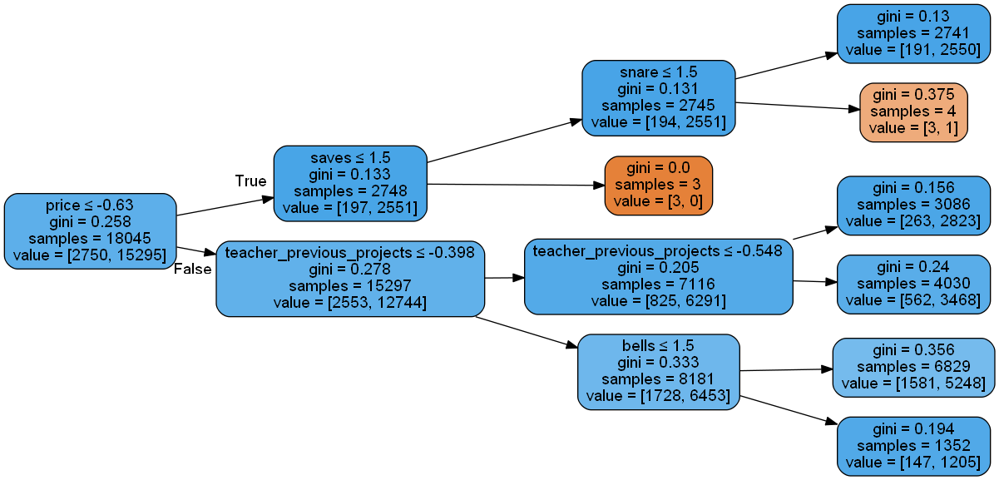

In [182]:
import warnings
warnings.filterwarnings("ignore")

from sklearn.externals.six import StringIO
from IPython.display import Image
from sklearn.tree import export_graphviz
import pydotplus
dot_data = StringIO()
export_graphviz(clf, out_file=dot_data, filled=True, rounded=True, special_characters=True, feature_names=feature_agg_bow,rotate=True)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
Image(graph.create_png())

In [183]:
from sklearn.model_selection import GridSearchCV
from sklearn.tree import DecisionTreeClassifier

dtree_1 = DecisionTreeClassifier(class_weight = 'balanced')

parameters = {'max_depth':[1, 5, 10, 50, 100, 500, 100],'min_samples_split':[5, 10, 100, 500]}

In [184]:
clf_1 = GridSearchCV(dtree_1,parameters,cv =3,scoring = 'roc_auc',return_train_score = True)
clf_1 = clf_1.fit(X_tr,y_train)


In [185]:
train_auc= clf_1.cv_results_['mean_train_score']
train_auc_std= clf_1.cv_results_['std_train_score']
cv_auc = clf_1.cv_results_['mean_test_score'] 
cv_auc_std= clf_1.cv_results_['std_test_score']


In [186]:
train_auc

array([0.54238082, 0.54238082, 0.54238082, 0.54238082, 0.6912459 ,
       0.69078995, 0.68961469, 0.68717859, 0.81239082, 0.80869455,
       0.78414795, 0.75277074, 0.97976095, 0.97296976, 0.92032987,
       0.82338308, 0.99474074, 0.99141298, 0.95431151, 0.8364804 ,
       0.99992211, 0.99855139, 0.96707695, 0.84909437, 0.99471016,
       0.99047303, 0.95321789, 0.83674906])

In [187]:
cv_auc

array([0.53841546, 0.53841546, 0.53841546, 0.53841546, 0.6509972 ,
       0.65086577, 0.65073832, 0.65089121, 0.6537564 , 0.65242466,
       0.65867181, 0.66347248, 0.57854054, 0.57813962, 0.60293928,
       0.62733084, 0.56405607, 0.56922576, 0.58376689, 0.61538402,
       0.5600304 , 0.56337943, 0.58042951, 0.6040288 , 0.56551475,
       0.56897311, 0.58696864, 0.61589964])

In [188]:
print(clf_1.best_estimator_)
#Mean cross-validated score of the best_estimator
print(clf_1.score(X_tr,y_train))
print(clf_1.score(X_te,y_test))

DecisionTreeClassifier(class_weight='balanced', criterion='gini', max_depth=10,
                       max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=500,
                       min_weight_fraction_leaf=0.0, presort=False,
                       random_state=None, splitter='best')
0.7417242473773366
0.6668211542724742


In [189]:
def batch_predict(clf, data):
    # roc_auc_score(y_true, y_score) the 2nd parameter should be probability estimates of the positive class
    # not the predicted outputs

    y_data_pred = []
    tr_loop = data.shape[0] - data.shape[0]%1000
    # consider you X_tr shape is 49041, then your cr_loop will be 49041 - 49041%1000 = 49000
    # in this for loop we will iterate unti the last 1000 multiplier
    for i in range(0, tr_loop, 1000):
        y_data_pred.extend(clf.predict_proba(data[i:i+1000])[:,1])
    # we will be predicting for the last data points
    y_data_pred.extend(clf.predict_proba(data[tr_loop:])[:,1])
    
    return y_data_pred

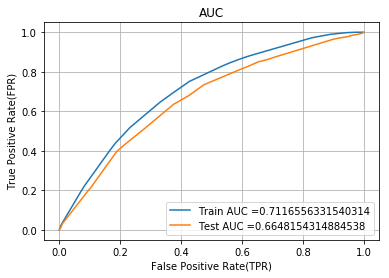

In [190]:
# https://scikit-learn.org/stable/modules/generated/sklearn.metrics.roc_curve.html#sklearn.metrics.roc_curve
from sklearn.metrics import roc_curve, auc

model = DecisionTreeClassifier(max_depth = 10, min_samples_split = 500)

model.fit(X_tr, y_train)

# roc_auc_score(y_true, y_score) the 2nd parameter should be probability estimates of the positive class
# not the predicted outputs

y_train_pred = batch_predict(model, X_tr)    
y_test_pred = batch_predict(model, X_te)

train_fpr, train_tpr, tr_thresholds = roc_curve(y_train, y_train_pred)
test_fpr, test_tpr, te_thresholds = roc_curve(y_test, y_test_pred)

plt.plot(train_fpr, train_tpr, label="Train AUC ="+str(auc(train_fpr, train_tpr)))
plt.plot(test_fpr, test_tpr, label="Test AUC ="+str(auc(test_fpr, test_tpr)))
plt.legend()
plt.xlabel("False Positive Rate(TPR)")
plt.ylabel("True Positive Rate(FPR)")
plt.title("AUC")
plt.grid()
plt.show()

In [191]:
def predict(proba, threshould, fpr, tpr):
    
    t = threshould[np.argmax(fpr*(1-tpr))]
    
    # (tpr*(1-fpr)) will be maximum if your fpr is very low and tpr is very high
    
    print("the maximum value of tpr*(1-fpr)", max(tpr*(1-fpr)), "for threshold", np.round(t,3))
    predictions = []
    global prediction
    for i in proba:
        if i>=t:
            predictions.append(1)
        else:
            predictions.append(0)
    prediction= predictions
    return predictions

In [192]:
print("="*100)
from sklearn.metrics import confusion_matrix
print("Train confusion matrix")
print(confusion_matrix(y_train, predict(y_train_pred, tr_thresholds, train_fpr, train_fpr)))

Train confusion matrix
the maximum value of tpr*(1-fpr) 0.24880661157024794 for threshold 0.8
[[ 1280  1470]
 [ 2624 12671]]


the maximum value of tpr*(1-fpr) 0.24880661157024794 for threshold 0.8


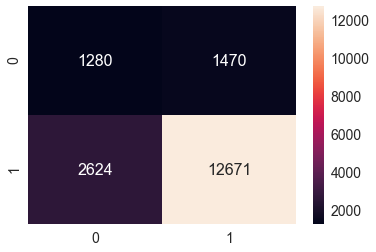

In [193]:
conf_matr_df_train_1 = pd.DataFrame(confusion_matrix(y_train, predict(y_train_pred, tr_thresholds, train_fpr, train_fpr)), range(2),range(2))
sns.set(font_scale=1.4)#for label size
sns.heatmap(conf_matr_df_train_1, annot=True,annot_kws={"size": 16}, fmt='g')

In [194]:
print("Test confusion matrix")
print(confusion_matrix(y_test, predict(y_test_pred, tr_thresholds, test_fpr, test_fpr)))

Test confusion matrix
the maximum value of tpr*(1-fpr) 0.24938243303597898 for threshold 0.857
[[ 1584  1434]
 [ 4457 12325]]


the maximum value of tpr*(1-fpr) 0.24938243303597898 for threshold 0.857


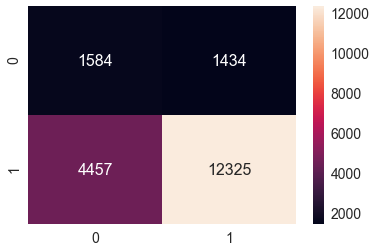

In [195]:
conf_matr_df_test_1 = pd.DataFrame(confusion_matrix(y_test, predict(y_test_pred, tr_thresholds, test_fpr, test_fpr)), range(2),range(2))
sns.set(font_scale=1.4)#for label size
sns.heatmap(conf_matr_df_test_1, annot=True,annot_kws={"size": 16}, fmt='g')

In [199]:
fpi = []
for i in range(len(y_test)):
    if (y_test.values[i] == 0 ) & (prediction[i] == 1):
        fpi.append(i)
fp_essay1 = []
for i in fpi:
    fp_essay1.append(X_test['essay'].values[i])

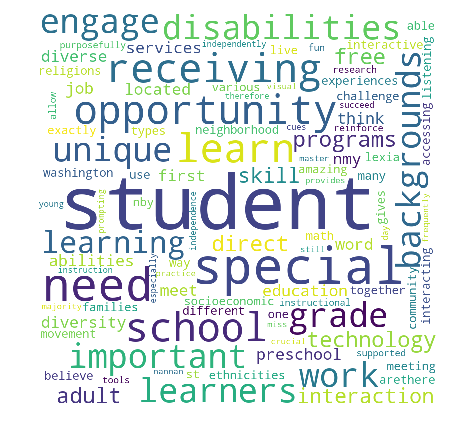

In [200]:
from wordcloud import WordCloud, STOPWORDS
comment_words = ' '
stopwords = set(STOPWORDS)
for val in fp_essay1 :
  val = str(val)
  tokens = val.split()
for i in range(len(tokens)):
  tokens[i] = tokens[i].lower()
for words in tokens :
  comment_words = comment_words + words + ' '
wordcloud = WordCloud(width = 800, height = 800, background_color ='white', stopwords = stopwords,min_font_size = 10).generate(comment_words)

plt.figure(figsize = (6, 6), facecolor = None)
plt.imshow(wordcloud)
plt.axis("off")
plt.tight_layout(pad = 0)
plt.show()

In [203]:
# first get the columns:
cols = X_test.columns
X_test_falsePos1 = pd.DataFrame(columns=cols)

# get the data of the false pisitives
for i in fpi : # (in fpi all the false positives data points indexes)
    X_test_falsePos1 = X_test_falsePos1.append(X_test.filter(items=[i], axis=0))

X_test_falsePos1.head(1)
len(X_test_falsePos1)

1434

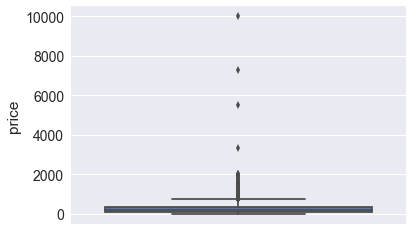

In [204]:
##Box Plot (FP 'price')
sns.boxplot(y='price', data=X_test_falsePos1)

<function matplotlib.pyplot.show(*args, **kw)>

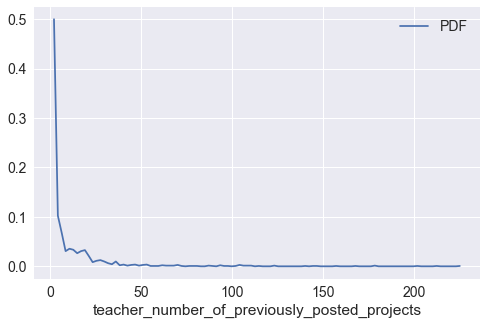

In [205]:
##PDF (FP ,teacher_number_of_previously_posted_projects)
plt.figure(figsize=(8,5))
counts, bin_edges = np.histogram(X_test_falsePos1['teacher_number_of_previously_posted_projects'],
bins='auto', density=True)
pdf = counts/sum(counts)
pdfP, = plt.plot(bin_edges[1:], pdf)
plt.legend([pdfP], ["PDF"])
plt.xlabel('teacher_number_of_previously_posted_projects')
plt.show

In [215]:
c=DecisionTreeClassifier (class_weight = 'balanced',criterion="entropy",max_depth=10,min_samples_split=500)
c.fit(X_tr, y_train)

DecisionTreeClassifier(class_weight='balanced', criterion='entropy',
                       max_depth=10, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=500,
                       min_weight_fraction_leaf=0.0, presort=False,
                       random_state=None, splitter='best')

In [ ]:
#Graphviz visualization of Decision Tree on bow

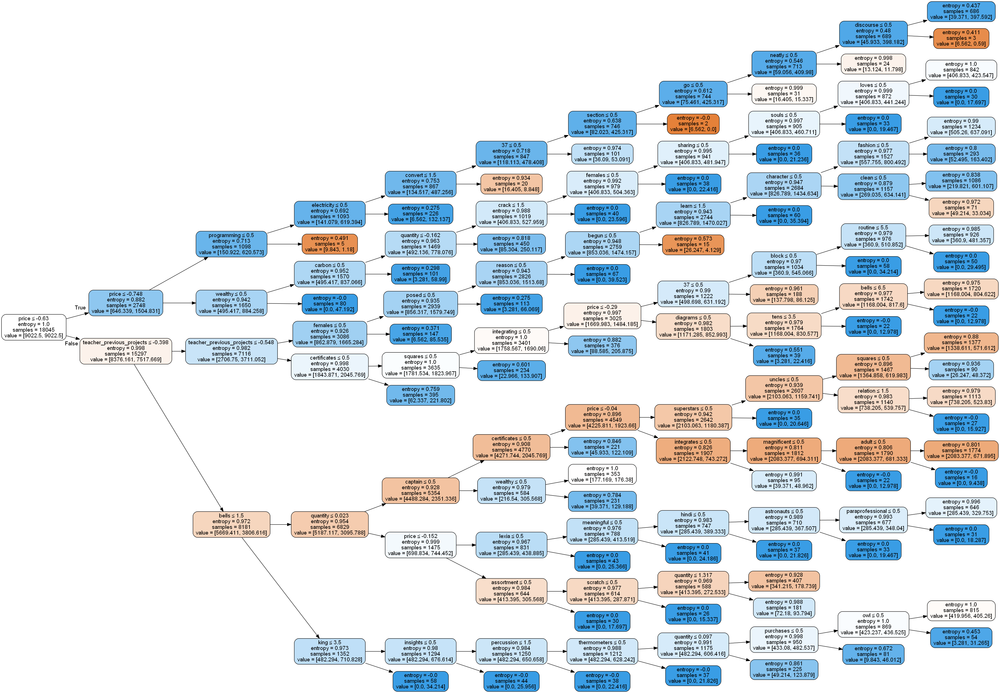

In [216]:
import warnings
warnings.filterwarnings("ignore")
from sklearn.externals.six import StringIO
from IPython.display import Image
from sklearn.tree import export_graphviz
import pydotplus
dot_data = StringIO()
export_graphviz(c, out_file=dot_data, filled=True, rounded=True, special_characters=True, feature_names=feature_agg_bow,rotate=True)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
Image(graph.create_png())

# categorical, numerical features + project_title(tfidf) + preprocessed_eassay (tfidf)

In [217]:
from scipy.sparse import hstack

X_tr_tfidf = hstack((X_train_essay_tfidf,X_train_title_tfidf,X_train_cat,X_train_clean_sub_ohe,X_train_school_state,X_train_project_grade_category,teacher_prefix_train,train_price,train_T,train_quantity)).tocsr()
X_te_tfidf = hstack((X_test_essay_tfidf,X_test_title_tfidf,X_test_cat,X_test_clean_sub_ohe,X_test_school_state,X_test_project_grade_category,teacher_prefix_test,test_price,test_T,test_quantity)).tocsr()
X_cr_tfidf = hstack((X_cv_essay_tfidf,X_cv_title_tfidf,X_cv_cat,X_cv_clean_sub_ohe,X_cv_school_state,X_cv_project_grade_category,teacher_prefix_cv,cv_price,cv_T,cv_quantity )).tocsr()

In [218]:
print(X_tr_tfidf.shape,y_train.shape)
print(X_te_tfidf.shape,y_test.shape)
print(X_cr_tfidf.shape,y_cv.shape)

(18045, 9104) (18045,)
(19800, 9104) (19800,)
(8889, 9104) (8889,)


In [220]:
#Feature aggregation
f=vectorizer_b.get_feature_names()
g=vectorizer_title_bow.get_feature_names()
h=vectorizer_tfidf.get_feature_names()
i=vectorizer_tfidf_clean_titles.get_feature_names()

feature_agg_bow = feature_1 + feature_2 + feature_3 + feature_4 + feature_5 + f + g
feature_agg_tfidf = feature_1 + feature_2 + feature_3+ feature_4 + feature_5 +h  + i
# p is price, q is quantity, t is teacher previous year projects
feature_agg_bow.append('price')
feature_agg_tfidf.append('price')
feature_agg_bow.append('quantity')
feature_agg_tfidf.append('quantity')
feature_agg_bow.append('teacher_previous_projects')
feature_agg_tfidf.append('teacher_previous_projects')






In [221]:
len(feature_agg_tfidf)

9104

In [222]:
from sklearn.tree import DecisionTreeClassifier
dtree_1 = DecisionTreeClassifier(max_depth = 3)
clf_1 = dtree_1.fit(X_tr_tfidf, y_train)

In [223]:
import os
os.environ["PATH"] += os.pathsep + 'C:/Program Files (x86)/Graphviz2.38/bin/'


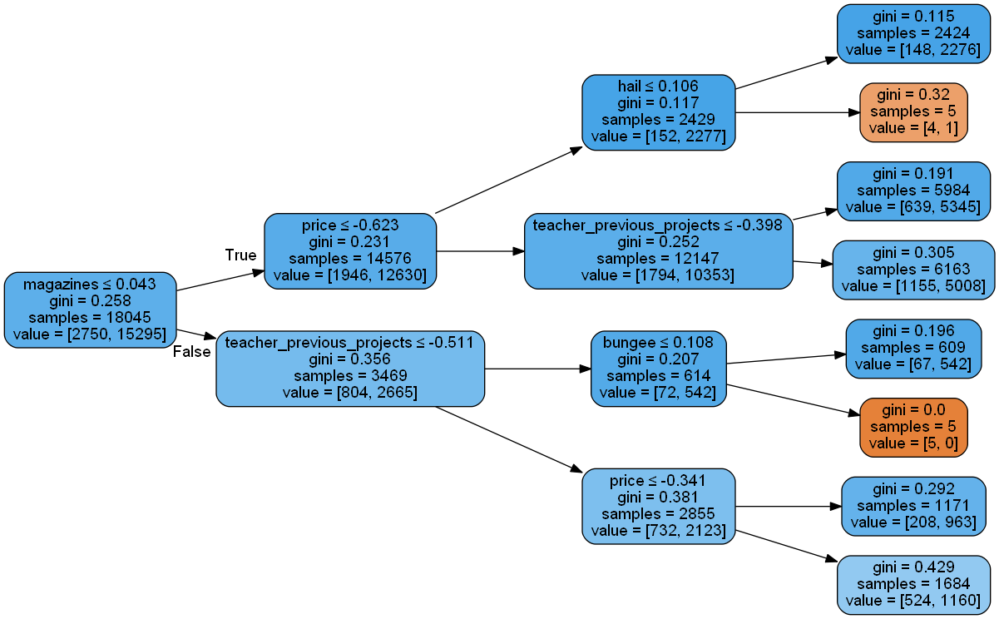

In [224]:
import warnings
warnings.filterwarnings("ignore")

from sklearn.externals.six import StringIO
from IPython.display import Image
from sklearn.tree import export_graphviz
import pydotplus
dot_data = StringIO()
export_graphviz(clf_1, out_file=dot_data, filled=True, rounded=True, special_characters=True, feature_names=feature_agg_tfidf,rotate=True)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
Image(graph.create_png())

In [225]:
from sklearn.model_selection import GridSearchCV
from sklearn.tree import DecisionTreeClassifier

dtree_1 = DecisionTreeClassifier(class_weight = 'balanced')

parameters = {'max_depth':[1, 5, 10, 50, 100, 500, 100],'min_samples_split':[5, 10, 100, 500]}

In [226]:
clf_1 = GridSearchCV(dtree_1,parameters,cv =3,scoring = 'roc_auc',return_train_score = True)
clf_1 = clf_1.fit(X_tr_tfidf,y_train)


In [227]:
train_auc= clf_1.cv_results_['mean_train_score']
train_auc_std= clf_1.cv_results_['std_train_score']
cv_auc = clf_1.cv_results_['mean_test_score'] 
cv_auc_std= clf_1.cv_results_['std_test_score']


In [228]:
train_auc

array([0.54238082, 0.54238082, 0.54238082, 0.54238082, 0.69666375,
       0.69618142, 0.69396289, 0.69071193, 0.8315037 , 0.8274575 ,
       0.79650604, 0.76039005, 0.98790303, 0.9820551 , 0.93634231,
       0.84555441, 0.99881377, 0.99692725, 0.9644001 , 0.84929569,
       0.99995751, 0.99896711, 0.96874517, 0.85087329, 0.99913297,
       0.99686389, 0.96397744, 0.84977749])

In [229]:
cv_auc

array([0.53841546, 0.53841546, 0.53841546, 0.53841546, 0.64404999,
       0.64443403, 0.6450178 , 0.64532848, 0.64060917, 0.63843462,
       0.64345301, 0.65835847, 0.57499485, 0.57152592, 0.58907947,
       0.62108148, 0.55716315, 0.55658338, 0.57200854, 0.61900298,
       0.55359132, 0.55412299, 0.56345411, 0.61794358, 0.55358135,
       0.5537851 , 0.56952609, 0.61957313])

In [230]:
print(clf_1.best_estimator_)
#Mean cross-validated score of the best_estimator
print(clf_1.score(X_tr_tfidf,y_train))
print(clf_1.score(X_te_tfidf,y_test))

DecisionTreeClassifier(class_weight='balanced', criterion='gini', max_depth=10,
                       max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=500,
                       min_weight_fraction_leaf=0.0, presort=False,
                       random_state=None, splitter='best')
0.7652798597283723
0.6554545329619234


In [231]:
def batch_predict(clf, data):
    # roc_auc_score(y_true, y_score) the 2nd parameter should be probability estimates of the positive class
    # not the predicted outputs

    y_data_pred = []
    tr_loop = data.shape[0] - data.shape[0]%1000
    # consider you X_tr shape is 49041, then your cr_loop will be 49041 - 49041%1000 = 49000
    # in this for loop we will iterate unti the last 1000 multiplier
    for i in range(0, tr_loop, 1000):
        y_data_pred.extend(clf.predict_proba(data[i:i+1000])[:,1])
    # we will be predicting for the last data points
    y_data_pred.extend(clf.predict_proba(data[tr_loop:])[:,1])
    
    return y_data_pred

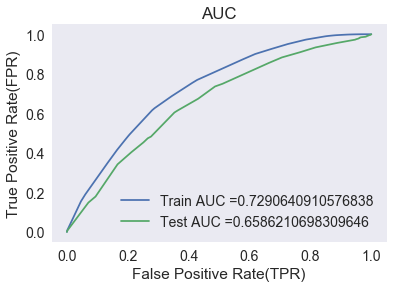

In [232]:
# https://scikit-learn.org/stable/modules/generated/sklearn.metrics.roc_curve.html#sklearn.metrics.roc_curve
from sklearn.metrics import roc_curve, auc

model = DecisionTreeClassifier(max_depth = 10, min_samples_split = 500)

model.fit(X_tr_tfidf, y_train)

# roc_auc_score(y_true, y_score) the 2nd parameter should be probability estimates of the positive class
# not the predicted outputs

y_train_pred = batch_predict(model, X_tr_tfidf)    
y_test_pred = batch_predict(model, X_te_tfidf)

train_fpr, train_tpr, tr_thresholds = roc_curve(y_train, y_train_pred)
test_fpr, test_tpr, te_thresholds = roc_curve(y_test, y_test_pred)

plt.plot(train_fpr, train_tpr, label="Train AUC ="+str(auc(train_fpr, train_tpr)))
plt.plot(test_fpr, test_tpr, label="Test AUC ="+str(auc(test_fpr, test_tpr)))
plt.legend()
plt.xlabel("False Positive Rate(TPR)")
plt.ylabel("True Positive Rate(FPR)")
plt.title("AUC")
plt.grid()
plt.show()

In [233]:
def predict(proba, threshould, fpr, tpr):
    
    t = threshould[np.argmax(fpr*(1-tpr))]
    
    # (tpr*(1-fpr)) will be maximum if your fpr is very low and tpr is very high
    
    print("the maximum value of tpr*(1-fpr)", max(tpr*(1-fpr)), "for threshold", np.round(t,3))
    predictions = []
    global prediction
    for i in proba:
        if i>=t:
            predictions.append(1)
        else:
            predictions.append(0)
    prediction= predictions
    return predictions

In [234]:
print("="*100)
from sklearn.metrics import confusion_matrix
print("Train confusion matrix")
print(confusion_matrix(y_train, predict(y_train_pred, tr_thresholds, train_fpr, train_fpr)))

Train confusion matrix
the maximum value of tpr*(1-fpr) 0.24481600000000003 for threshold 0.838
[[ 1573  1177]
 [ 3533 11762]]


the maximum value of tpr*(1-fpr) 0.24481600000000003 for threshold 0.838


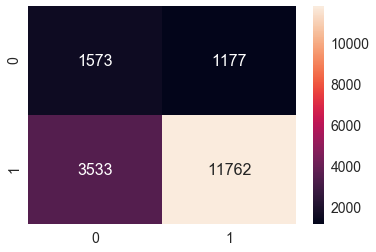

In [235]:
conf_matr_df_train_1 = pd.DataFrame(confusion_matrix(y_train, predict(y_train_pred, tr_thresholds, train_fpr, train_fpr)), range(2),range(2))
sns.set(font_scale=1.4)#for label size
sns.heatmap(conf_matr_df_train_1, annot=True,annot_kws={"size": 16}, fmt='g')

In [236]:
print("Test confusion matrix")
print(confusion_matrix(y_test, predict(y_test_pred, tr_thresholds, test_fpr, test_fpr)))

Test confusion matrix
the maximum value of tpr*(1-fpr) 0.24987308312703851 for threshold 0.838
[[ 1475  1543]
 [ 4205 12577]]


the maximum value of tpr*(1-fpr) 0.24987308312703851 for threshold 0.838


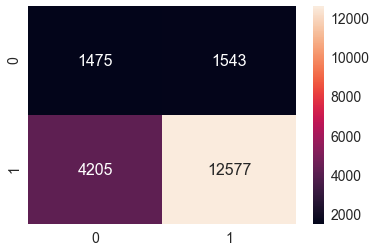

In [237]:
conf_matr_df_test_1 = pd.DataFrame(confusion_matrix(y_test, predict(y_test_pred, tr_thresholds, test_fpr, test_fpr)), range(2),range(2))
sns.set(font_scale=1.4)#for label size
sns.heatmap(conf_matr_df_test_1, annot=True,annot_kws={"size": 16}, fmt='g')

In [245]:
fpi = []
for i in range(len(y_test)):
    if (y_test.values[i] == 0 ) & (prediction[i] == 1):
        fpi.append(i)
fp_essay1 = []
for i in fpi:
    fp_essay1.append(X_test['essay'].values[i])

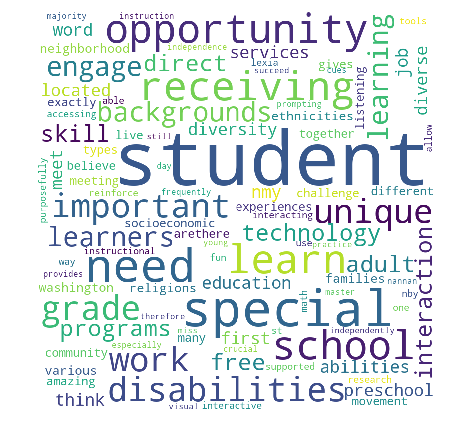

In [246]:
from wordcloud import WordCloud, STOPWORDS
comment_words = ' '
stopwords = set(STOPWORDS)
for val in fp_essay1 :
  val = str(val)
  tokens = val.split()
for i in range(len(tokens)):
  tokens[i] = tokens[i].lower()
for words in tokens :
  comment_words = comment_words + words + ' '
wordcloud = WordCloud(width = 800, height = 800, background_color ='white', stopwords = stopwords,min_font_size = 10).generate(comment_words)

plt.figure(figsize = (6, 6), facecolor = None)
plt.imshow(wordcloud)
plt.axis("off")
plt.tight_layout(pad = 0)
plt.show()

In [247]:
# first get the columns:
cols = X_test.columns
X_test_falsePos1 = pd.DataFrame(columns=cols)

# get the data of the false pisitives
for i in fpi : # (in fpi all the false positives data points indexes)
    
  X_test_falsePos1 = X_test_falsePos1.append(X_test.filter(items=[i], axis=0))

X_test_falsePos1.head(1)
len(X_test_falsePos1)

1543

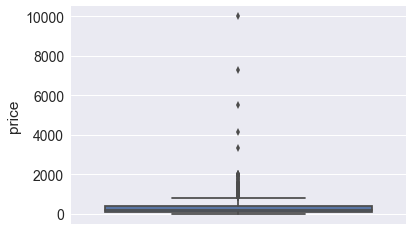

In [248]:
##Box Plot (FP 'price')
sns.boxplot(y='price', data=X_test_falsePos1)

<function matplotlib.pyplot.show(*args, **kw)>

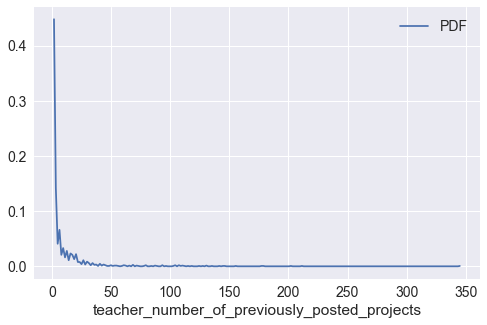

In [249]:
##PDF (FP ,teacher_number_of_previously_posted_projects)

plt.figure(figsize=(8,5))
counts, bin_edges = np.histogram(X_test_falsePos1['teacher_number_of_previously_posted_projects'],
bins='auto', density=True)
pdf = counts/sum(counts)
pdfP, = plt.plot(bin_edges[1:], pdf)
plt.legend([pdfP], ["PDF"])
plt.xlabel('teacher_number_of_previously_posted_projects')
plt.show

# Graphviz visualization of Decision Tree on TFIDF, 

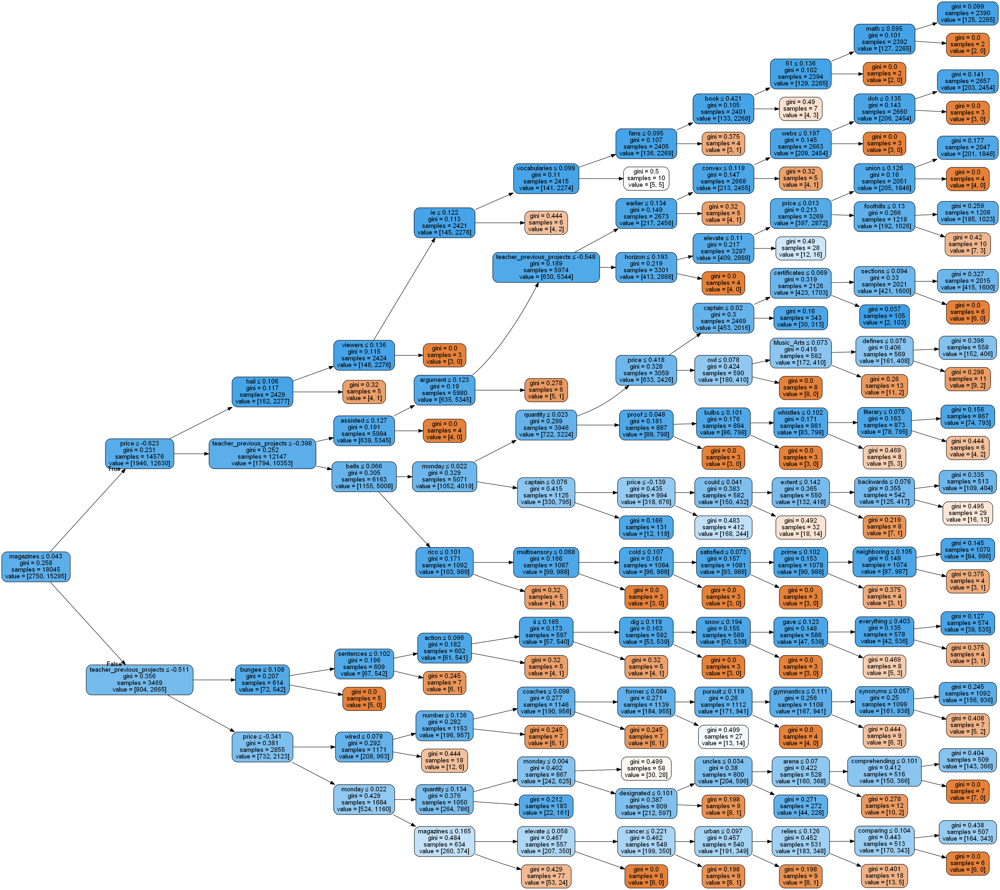

In [250]:
import warnings
warnings.filterwarnings("ignore")
from sklearn.externals.six import StringIO
from IPython.display import Image
from sklearn.tree import export_graphviz
import pydotplus
dot_data = StringIO()
export_graphviz(model, out_file=dot_data, filled=True, rounded=True, special_characters=True, feature_names=feature_agg_tfidf,rotate=True)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
Image(graph.create_png())

# categorical, numerical features + project_title(avgw2v) + preprocessed_eassay (avgw2v)

In [251]:
from scipy.sparse import hstack

X_tr_w2v = hstack((train_avg_w2v_vectors,train_avg_w2v_vectors_title ,X_train_cat,X_train_clean_sub_ohe,X_train_school_state,X_train_project_grade_category,teacher_prefix_train,train_price,train_T,train_quantity)).tocsr()
X_te_w2v = hstack((test_avg_w2v_vectors,test_avg_w2v_vectors_title,X_test_cat,X_test_clean_sub_ohe,X_test_school_state,X_test_project_grade_category,teacher_prefix_test,test_price,test_T,test_quantity)).tocsr()
X_cr_w2v = hstack((cv_avg_w2v_vectors,cv_avg_w2v_vectors_title,X_cv_cat,X_cv_clean_sub_ohe,X_cv_school_state,X_cv_project_grade_category,teacher_prefix_cv,cv_price,cv_T,cv_quantity )).tocsr()

In [252]:
print(X_tr_w2v.shape,y_train.shape)
print(X_te_w2v.shape,y_test.shape)
print(X_cr_w2v.shape,y_cv.shape)

(18045, 703) (18045,)
(19800, 703) (19800,)
(8889, 703) (8889,)


In [253]:
from sklearn.model_selection import GridSearchCV
from sklearn.tree import DecisionTreeClassifier

dtree_1 = DecisionTreeClassifier(class_weight = 'balanced')

parameters = {'max_depth':[1, 5, 10, 50, 100, 500, 100],'min_samples_split':[5, 10,25,50 ,100, 500]}

In [254]:
clf_1 = GridSearchCV(dtree_1,parameters,cv =3,scoring = 'roc_auc',return_train_score = True)
clf_1 = clf_1.fit(X_tr_w2v,y_train)


In [255]:
train_auc= clf_1.cv_results_['mean_train_score']
train_auc_std= clf_1.cv_results_['std_train_score']
cv_auc = clf_1.cv_results_['mean_test_score'] 
cv_auc_std= clf_1.cv_results_['std_test_score']


In [256]:
train_auc

array([0.54238082, 0.54238082, 0.54238082, 0.54238082, 0.54238082,
       0.54238082, 0.708934  , 0.70890139, 0.7076662 , 0.70555119,
       0.70417751, 0.69920751, 0.90056372, 0.89766371, 0.88405227,
       0.86524532, 0.84188546, 0.76119622, 0.99942231, 0.99859123,
       0.99044392, 0.97022733, 0.92440102, 0.77242169, 0.99997667,
       0.99954424, 0.99246208, 0.97412069, 0.92992868, 0.77234256,
       0.99997848, 0.99957559, 0.9927032 , 0.97405935, 0.92928808,
       0.7709239 , 0.99998202, 0.99957229, 0.99309466, 0.97427118,
       0.92929055, 0.77134032])

In [257]:
cv_auc

array([0.53841546, 0.53841546, 0.53841546, 0.53841546, 0.53841546,
       0.53841546, 0.62669407, 0.62633913, 0.62637219, 0.62719785,
       0.6271088 , 0.62776234, 0.57325709, 0.57247223, 0.57412163,
       0.58397164, 0.5930578 , 0.61573643, 0.53226586, 0.53131817,
       0.5346599 , 0.55133898, 0.56427962, 0.6089345 , 0.5297918 ,
       0.53206127, 0.53120995, 0.54878809, 0.55479509, 0.6077172 ,
       0.53152411, 0.53172778, 0.53154098, 0.545086  , 0.55514055,
       0.61049044, 0.52816855, 0.52823414, 0.53324389, 0.54741246,
       0.55577658, 0.61021167])

In [258]:
print(clf_1.best_estimator_)
#Mean cross-validated score of the best_estimator
print(clf_1.score(X_tr_w2v,y_train))
print(clf_1.score(X_te_w2v,y_test))

DecisionTreeClassifier(class_weight='balanced', criterion='gini', max_depth=5,
                       max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=500,
                       min_weight_fraction_leaf=0.0, presort=False,
                       random_state=None, splitter='best')
0.6906166721150703
0.6511496310343555


In [259]:
def batch_predict(clf, data):
    # roc_auc_score(y_true, y_score) the 2nd parameter should be probability estimates of the positive class
    # not the predicted outputs

    y_data_pred = []
    tr_loop = data.shape[0] - data.shape[0]%1000
    # consider you X_tr shape is 49041, then your cr_loop will be 49041 - 49041%1000 = 49000
    # in this for loop we will iterate unti the last 1000 multiplier
    for i in range(0, tr_loop, 1000):
        y_data_pred.extend(clf.predict_proba(data[i:i+1000])[:,1])
    # we will be predicting for the last data points
    y_data_pred.extend(clf.predict_proba(data[tr_loop:])[:,1])
    
    return y_data_pred

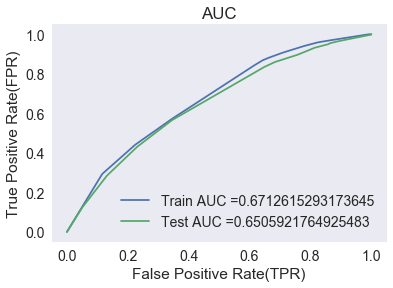

In [291]:
# https://scikit-learn.org/stable/modules/generated/sklearn.metrics.roc_curve.html#sklearn.metrics.roc_curve
from sklearn.metrics import roc_curve, auc

model = DecisionTreeClassifier(max_depth = 5, min_samples_split = 500)

model.fit(X_tr_w2v, y_train)

# roc_auc_score(y_true, y_score) the 2nd parameter should be probability estimates of the positive class
# not the predicted outputs

y_train_pred = batch_predict(model, X_tr_w2v)    
y_test_pred = batch_predict(model, X_te_w2v)

train_fpr, train_tpr, tr_thresholds = roc_curve(y_train, y_train_pred)
test_fpr, test_tpr, te_thresholds = roc_curve(y_test, y_test_pred)

plt.plot(train_fpr, train_tpr, label="Train AUC ="+str(auc(train_fpr, train_tpr)))
plt.plot(test_fpr, test_tpr, label="Test AUC ="+str(auc(test_fpr, test_tpr)))
plt.legend()
plt.xlabel("False Positive Rate(TPR)")
plt.ylabel("True Positive Rate(FPR)")
plt.title("AUC")
plt.grid()
plt.show()

In [292]:
def predict(proba, threshould, fpr, tpr):
    
    t = threshould[np.argmax(fpr*(1-tpr))]
    
    # (tpr*(1-fpr)) will be maximum if your fpr is very low and tpr is very high
    
    print("the maximum value of tpr*(1-fpr)", max(tpr*(1-fpr)), "for threshold", np.round(t,3))
    predictions = []
    global prediction
    for i in proba:
        if i>=t:
            predictions.append(1)
        else:
            predictions.append(0)
    prediction= predictions
    return predictions

In [293]:
print("="*100)
from sklearn.metrics import confusion_matrix
print("Train confusion matrix")
print(confusion_matrix(y_train, predict(y_train_pred, tr_thresholds, train_fpr, train_fpr)))

Train confusion matrix
the maximum value of tpr*(1-fpr) 0.2363747438016529 for threshold 0.848
[[ 1054  1696]
 [ 2390 12905]]


the maximum value of tpr*(1-fpr) 0.2363747438016529 for threshold 0.848


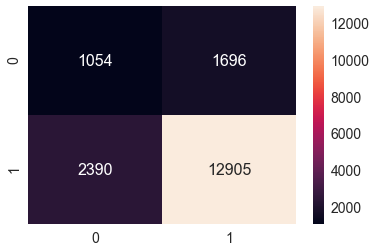

In [294]:
conf_matr_df_train_1 = pd.DataFrame(confusion_matrix(y_train, predict(y_train_pred, tr_thresholds, train_fpr, train_fpr)), range(2),range(2))
sns.set(font_scale=1.4)#for label size
sns.heatmap(conf_matr_df_train_1, annot=True,annot_kws={"size": 16}, fmt='g')

In [295]:
print("Test confusion matrix")
print(confusion_matrix(y_test, predict(y_test_pred, tr_thresholds, test_fpr, test_fpr)))

Test confusion matrix
the maximum value of tpr*(1-fpr) 0.22786629021980334 for threshold 0.848
[[ 1060  1958]
 [ 2776 14006]]


the maximum value of tpr*(1-fpr) 0.22786629021980334 for threshold 0.848


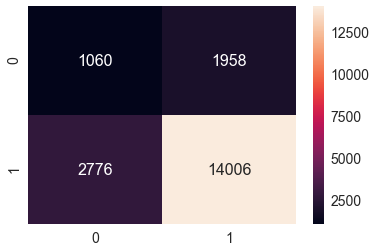

In [296]:
conf_matr_df_test_1 = pd.DataFrame(confusion_matrix(y_test, predict(y_test_pred, tr_thresholds, test_fpr, test_fpr)), range(2),range(2))
sns.set(font_scale=1.4)#for label size
sns.heatmap(conf_matr_df_test_1, annot=True,annot_kws={"size": 16}, fmt='g')

In [297]:
fpi = []
for i in range(len(y_test)):
    if (y_test.values[i] == 0 ) & (prediction[i] == 1):
        fpi.append(i)
fp_essay1 = []
for i in fpi:
    fp_essay1.append(X_test['essay'].values[i])

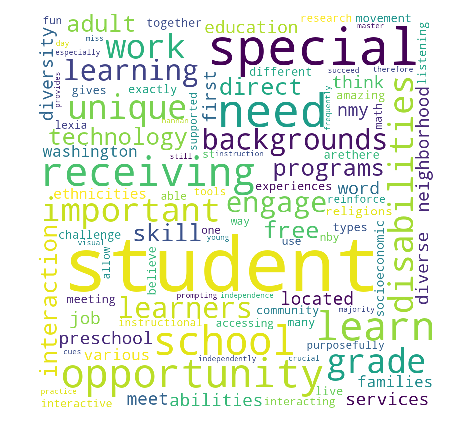

In [298]:
from wordcloud import WordCloud, STOPWORDS
comment_words = ' '
stopwords = set(STOPWORDS)
for val in fp_essay1 :
  val = str(val)
  tokens = val.split()
for i in range(len(tokens)):
  tokens[i] = tokens[i].lower()
for words in tokens :
  comment_words = comment_words + words + ' '
wordcloud = WordCloud(width = 800, height = 800, background_color ='white', stopwords = stopwords,min_font_size = 10).generate(comment_words)

plt.figure(figsize = (6, 6), facecolor = None)
plt.imshow(wordcloud)
plt.axis("off")
plt.tight_layout(pad = 0)
plt.show()

In [299]:
# first get the columns:
cols = X_test.columns
X_test_falsePos1 = pd.DataFrame(columns=cols)

# get the data of the false pisitives
for i in fpi : # (in fpi all the false positives data points indexes)
    
  X_test_falsePos1 = X_test_falsePos1.append(X_test.filter(items=[i], axis=0))

X_test_falsePos1.head(1)
len(X_test_falsePos1)

1958

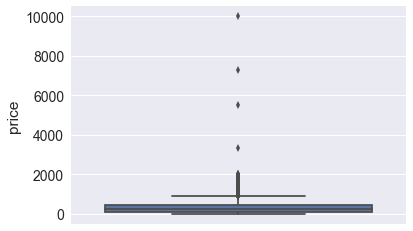

In [300]:
##Box Plot (FP 'price')
sns.boxplot(y='price', data=X_test_falsePos1)

<function matplotlib.pyplot.show(*args, **kw)>

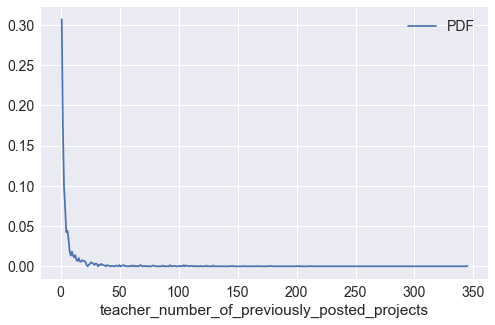

In [301]:
##PDF (FP ,teacher_number_of_previously_posted_projects)
plt.figure(figsize=(8,5))
counts, bin_edges = np.histogram(X_test_falsePos1['teacher_number_of_previously_posted_projects'],
bins='auto', density=True)
pdf = counts/sum(counts)
pdfP, = plt.plot(bin_edges[1:], pdf)
plt.legend([pdfP], ["PDF"])
plt.xlabel('teacher_number_of_previously_posted_projects')
plt.show

# categorical, numerical features + project_title(tfidfw2v) + preprocessed_eassay (tfidfw2v)

In [281]:
from scipy.sparse import hstack

X_tr_tfidf_w2v = hstack((train_tfidf_w2v_vectors,train_title_tfidf_w2v_vectors,X_train_cat,X_train_clean_sub_ohe,X_train_school_state,X_train_project_grade_category,teacher_prefix_train,train_price,train_T,train_quantity)).tocsr()
X_te_tfidf_w2v = hstack((test_tfidf_w2v_vectors,test_title_tfidf_w2v_vectors,X_test_cat,X_test_clean_sub_ohe,X_test_school_state,X_test_project_grade_category,teacher_prefix_test,test_price,test_T,test_quantity)).tocsr()
X_cr_tfidf_w2v = hstack((cv_tfidf_w2v_vectors,cv_title_tfidf_w2v_vectors,X_cv_cat,X_cv_clean_sub_ohe,X_cv_school_state,X_cv_project_grade_category,teacher_prefix_cv,cv_price,cv_T,cv_quantity )).tocsr()

In [282]:
print(X_tr_tfidf_w2v.shape,y_train.shape)
print(X_te_tfidf_w2v.shape,y_test.shape)
print(X_cr_tfidf_w2v.shape,y_cv.shape)

(18045, 703) (18045,)
(19800, 703) (19800,)
(8889, 703) (8889,)


In [283]:
from sklearn.model_selection import GridSearchCV
from sklearn.tree import DecisionTreeClassifier

dtree_1 = DecisionTreeClassifier()

parameters = {'max_depth':[1, 5, 10, 50, 100, 500, 100],'min_samples_split':[5, 10,25,50,75, 100, 500]}

In [284]:
clf_1 = GridSearchCV(dtree_1,parameters,cv =3,scoring = 'roc_auc',return_train_score = True)
clf_1 = clf_1.fit(X_tr_tfidf_w2v,y_train)


In [285]:
train_auc= clf_1.cv_results_['mean_train_score']
train_auc_std= clf_1.cv_results_['std_train_score']
cv_auc = clf_1.cv_results_['mean_test_score'] 
cv_auc_std= clf_1.cv_results_['std_test_score']


In [286]:
train_auc

array([0.56292379, 0.56292379, 0.56292379, 0.56292379, 0.56292379,
       0.56292379, 0.56292379, 0.6943707 , 0.69417947, 0.69384581,
       0.69384581, 0.69362095, 0.69335795, 0.69163035, 0.82841211,
       0.82560028, 0.81494857, 0.80454927, 0.79499687, 0.78734389,
       0.74305078, 0.99934027, 0.99629327, 0.98205164, 0.96236654,
       0.94987596, 0.93570252, 0.82781397, 0.9993856 , 0.99613719,
       0.98264999, 0.96296557, 0.94835875, 0.93764882, 0.82712886,
       0.99943685, 0.99616422, 0.98204486, 0.96362612, 0.94810534,
       0.93557098, 0.82386668, 0.99941323, 0.99628128, 0.98238864,
       0.96279059, 0.94962418, 0.93667505, 0.82305803])

In [287]:
cv_auc

array([0.55399008, 0.55399008, 0.55399008, 0.55399008, 0.55399008,
       0.55399008, 0.55399008, 0.62975775, 0.62950587, 0.62959902,
       0.62966322, 0.62959318, 0.62953531, 0.6300379 , 0.58468826,
       0.58799352, 0.59546342, 0.60179026, 0.60400734, 0.60996643,
       0.62485328, 0.52697357, 0.53724123, 0.54783463, 0.56063984,
       0.56316222, 0.56930013, 0.60366982, 0.53728793, 0.5370846 ,
       0.54659849, 0.55815559, 0.56752626, 0.56971124, 0.60731704,
       0.53544552, 0.53538144, 0.55169043, 0.56122973, 0.56777787,
       0.57682755, 0.60505248, 0.53616144, 0.5420731 , 0.54483868,
       0.55781683, 0.56395908, 0.57251037, 0.60365786])

In [288]:
print(clf_1.best_estimator_)
#Mean cross-validated score of the best_estimator
print(clf_1.score(X_tr_tfidf_w2v,y_train))
print(clf_1.score(X_te_tfidf_w2v,y_test))

DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=5,
                       max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=500,
                       min_weight_fraction_leaf=0.0, presort=False,
                       random_state=None, splitter='best')
0.6803825968082261
0.6436017233902429


In [289]:
def batch_predict(clf, data):
    # roc_auc_score(y_true, y_score) the 2nd parameter should be probability estimates of the positive class
    # not the predicted outputs

    y_data_pred = []
    tr_loop = data.shape[0] - data.shape[0]%1000
    # consider you X_tr shape is 49041, then your cr_loop will be 49041 - 49041%1000 = 49000
    # in this for loop we will iterate unti the last 1000 multiplier
    for i in range(0, tr_loop, 1000):
        y_data_pred.extend(clf.predict_proba(data[i:i+1000])[:,1])
    # we will be predicting for the last data points
    y_data_pred.extend(clf.predict_proba(data[tr_loop:])[:,1])
    
    return y_data_pred

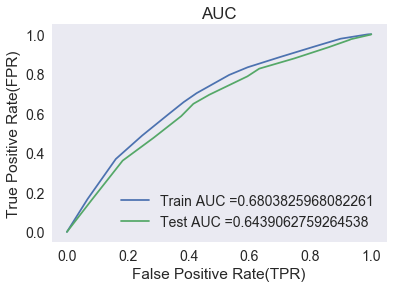

In [302]:
# https://scikit-learn.org/stable/modules/generated/sklearn.metrics.roc_curve.html#sklearn.metrics.roc_curve
from sklearn.metrics import roc_curve, auc

model = DecisionTreeClassifier(max_depth = 5, min_samples_split = 500)

model.fit(X_tr_tfidf_w2v, y_train)

# roc_auc_score(y_true, y_score) the 2nd parameter should be probability estimates of the positive class
# not the predicted outputs

y_train_pred = batch_predict(model, X_tr_tfidf_w2v)    
y_test_pred = batch_predict(model, X_te_tfidf_w2v)

train_fpr, train_tpr, tr_thresholds = roc_curve(y_train, y_train_pred)
test_fpr, test_tpr, te_thresholds = roc_curve(y_test, y_test_pred)

plt.plot(train_fpr, train_tpr, label="Train AUC ="+str(auc(train_fpr, train_tpr)))
plt.plot(test_fpr, test_tpr, label="Test AUC ="+str(auc(test_fpr, test_tpr)))
plt.legend()
plt.xlabel("False Positive Rate(TPR)")
plt.ylabel("True Positive Rate(FPR)")
plt.title("AUC")
plt.grid()
plt.show()

In [303]:
def predict(proba, threshould, fpr, tpr):
    
    t = threshould[np.argmax(fpr*(1-tpr))]
    
    # (tpr*(1-fpr)) will be maximum if your fpr is very low and tpr is very high
    
    print("the maximum value of tpr*(1-fpr)", max(tpr*(1-fpr)), "for threshold", np.round(t,3))
    predictions = []
    global prediction
    for i in proba:
        if i>=t:
            predictions.append(1)
        else:
            predictions.append(0)
    prediction= predictions
    return predictions

In [304]:
print("="*100)
from sklearn.metrics import confusion_matrix
print("Train confusion matrix")
print(confusion_matrix(y_train, predict(y_train_pred, tr_thresholds, train_fpr, train_fpr)))

Train confusion matrix
the maximum value of tpr*(1-fpr) 0.24890499173553718 for threshold 0.827
[[ 1284  1466]
 [ 3148 12147]]


the maximum value of tpr*(1-fpr) 0.24890499173553718 for threshold 0.827


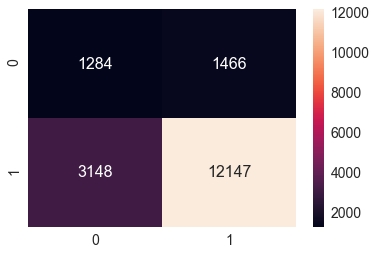

In [305]:
conf_matr_df_train_1 = pd.DataFrame(confusion_matrix(y_train, predict(y_train_pred, tr_thresholds, train_fpr, train_fpr)), range(2),range(2))
sns.set(font_scale=1.4)#for label size
sns.heatmap(conf_matr_df_train_1, annot=True,annot_kws={"size": 16}, fmt='g')

In [306]:
print("Test confusion matrix")
print(confusion_matrix(y_test, predict(y_test_pred, tr_thresholds, test_fpr, test_fpr)))

Test confusion matrix
the maximum value of tpr*(1-fpr) 0.24896698887742685 for threshold 0.855
[[ 1606  1412]
 [ 5135 11647]]


the maximum value of tpr*(1-fpr) 0.24896698887742685 for threshold 0.855


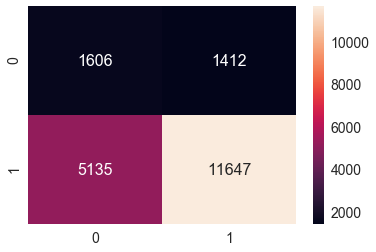

In [307]:
conf_matr_df_test_1 = pd.DataFrame(confusion_matrix(y_test, predict(y_test_pred, tr_thresholds, test_fpr, test_fpr)), range(2),range(2))
sns.set(font_scale=1.4)#for label size
sns.heatmap(conf_matr_df_test_1, annot=True,annot_kws={"size": 16}, fmt='g')

In [308]:
fpi = []
for i in range(len(y_test)):
    if (y_test.values[i] == 0 ) & (prediction[i] == 1):
        fpi.append(i)
fp_essay1 = []
for i in fpi:
    fp_essay1.append(X_test['essay'].values[i])

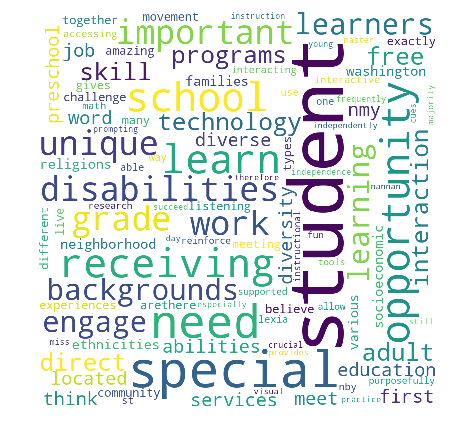

In [309]:
from wordcloud import WordCloud, STOPWORDS
comment_words = ' '
stopwords = set(STOPWORDS)
for val in fp_essay1 :
    val = str(val)
    tokens = val.split()
for i in range(len(tokens)):
    tokens[i] = tokens[i].lower()
for words in tokens :
    comment_words = comment_words + words + ' '
wordcloud = WordCloud(width = 800, height = 800, background_color ='white', stopwords = stopwords,min_font_size = 10).generate(comment_words)

plt.figure(figsize = (6, 6), facecolor = None)
plt.imshow(wordcloud)
plt.axis("off")
plt.tight_layout(pad = 0)
plt.show()

In [310]:
# first get the columns:
cols = X_test.columns
X_test_falsePos1 = pd.DataFrame(columns=cols)

# get the data of the false pisitives
for i in fpi : # (in fpi all the false positives data points indexes)
    X_test_falsePos1 = X_test_falsePos1.append(X_test.filter(items=[i], axis=0))

X_test_falsePos1.head(1)
len(X_test_falsePos1)

1412

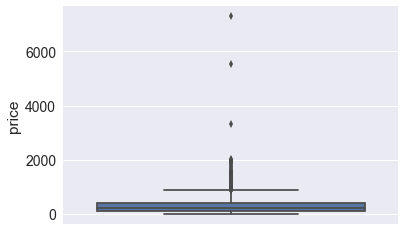

In [311]:
##Box Plot (FP 'price')
sns.boxplot(y='price', data=X_test_falsePos1)

<function matplotlib.pyplot.show(*args, **kw)>

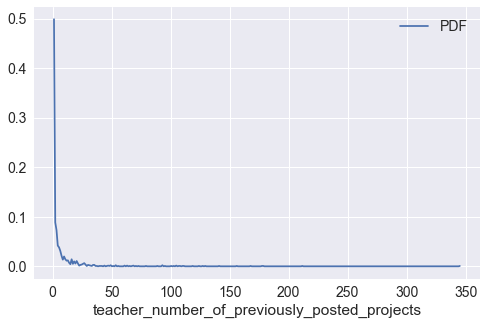

In [312]:
##PDF (FP ,teacher_number_of_previously_posted_projects)
plt.figure(figsize=(8,5))
counts, bin_edges = np.histogram(X_test_falsePos1['teacher_number_of_previously_posted_projects'],
bins='auto', density=True)
pdf = counts/sum(counts)
pdfP, = plt.plot(bin_edges[1:], pdf)
plt.legend([pdfP], ["PDF"])
plt.xlabel('teacher_number_of_previously_posted_projects')
plt.show

<h1>3. Conclusion</h1>

In [313]:
# http://zetcode.com/python/prettytable/

from prettytable import PrettyTable

#If you get a ModuleNotFoundError error , install prettytable using: pip3 install prettytable

x = PrettyTable()
x.field_names = ["Vectorizer", "Model", "Hyperparameters(max depth,min samples split)", "Train AUC", "Test AUC"]

x.add_row(["BOW", "Decision Trees","(10, 100)", 0.711, 0.664])
x.add_row(["TFIDF", "Decision Trees", "(10, 500)", 0.729, 0.658])
x.add_row(["AVG W2V", "Decision Trees", "(5, 500)", 0.671, 0.650])
x.add_row(["TFIDF W2V", "Decision Trees", "(5, 50)", 0.680, 0.643])


print(x)

+------------+----------------+----------------------------------------------+-----------+----------+
| Vectorizer |     Model      | Hyperparameters(max depth,min samples split) | Train AUC | Test AUC |
+------------+----------------+----------------------------------------------+-----------+----------+
|    BOW     | Decision Trees |                  (10, 100)                   |   0.711   |  0.664   |
|   TFIDF    | Decision Trees |                  (10, 500)                   |   0.729   |  0.658   |
|  AVG W2V   | Decision Trees |                   (5, 500)                   |   0.671   |   0.65   |
| TFIDF W2V  | Decision Trees |                   (5, 50)                    |    0.68   |  0.643   |
+------------+----------------+----------------------------------------------+-----------+----------+
